In [2]:
import os
import sys
sys.path.append('/Users/sonle/Documents/work/WB/')
import glob
import json
from tqdm.notebook import tqdm
import gc


import pandas as pd
import numpy as np
import xarray as xr
import rioxarray as rxr 
import geopandas as gpd
import rasterio
from rasterio import Affine
from rasterstats import zonal_stats
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


from GED.dhelper import get_daterange

# Zonal Stats

In [59]:
country = 'GEO'

stat = 'max'

level = 2

dates = get_daterange('2019-01-01', '2022-12-31', 
                      input_format='%Y-%m-%d', output_format='%Y-%m-%d')

poly = gpd.read_file(f'/Users/sonle/Documents/work/WB/GED/{country}/shapefiles/gadm41_{country}_{level}.json')

if level == 2:
    poly = poly.drop(['GID_0', 'COUNTRY', 'NL_NAME_1', 'VARNAME_2', 'NL_NAME_2',
                    'TYPE_2', 'ENGTYPE_2', 'CC_2', 'HASC_2'], axis=1)

if level == 1:
    poly = poly.drop(['GID_0', 'COUNTRY', 'NL_NAME_1', 'VARNAME_1',
                    'TYPE_1', 'ENGTYPE_1', 'CC_1', 'HASC_1', 'ISO_1'], axis=1)

# ds_sis = xr.open_dataset(f'/Users/sonle/Documents/work/WB/GED/{country}/{country}_historical_ERA5-Land_1981-2022_v1.nc', 
#                          decode_coords=True)

ds_sis = xr.open_dataset(f'/Users/sonle/Documents/work/WB/GED/{country}/{country}_historical_ERA5-Land_1981-2022_v1.0.nc', 
                         decode_coords=True)


# ds_sis = xr.open_dataset(f'/Users/sonle/Documents/work/WB/GED/{country}/tas_daily_ERA5-Land_hist_1981-2022_gadm40_UZB_0_v3.nc', 
#                          decode_coords=True)

ds_sis = ds_sis.rio.write_crs('EPSG:4326')

## SISTEMA Original

In [60]:
# df_lst = list()

# for date in tqdm(dates):
#     da_sis = ds_sis.sel(time=np.datetime64(date), method='nearest')['tas'].rio.to_raster('temp_file.tif', 
#                                                                         engine='GeoTIFF')
    
#     df_poly = poly.copy(deep=True)

#     # arr = rasterio.open('temp_file.tif').read(1)
#     # df_poly['avg_temp'] = pd.DataFrame(zonal_stats(poly.geometry, arr, affine=affine, stats='mean'))
#     df_poly[f'{stat}_temp_sis'] = pd.DataFrame(zonal_stats(poly.geometry, 'temp_file.tif', stats=f'{stat}'))
#     df_poly['date'] = date

#     df_lst.append(df_poly)

#     del da_sis, df_poly

# gc.collect()

In [61]:
# temp_sis = pd.concat(df_lst, axis=0).reset_index(drop=True).drop(['geometry'], axis=1)
# temp_sis


## SISTEMA GPBP ADAM

In [62]:
df_lst = list()

for date in tqdm(dates):

    if stat == 'max':
        da_sis = ds_sis.sel(time=np.datetime64(date), method='nearest')['tasmax'].rio.to_raster('temp_file.tif', 
                                                                            engine='GeoTIFF')
    if stat == 'mean': 
        da_sis = ds_sis.sel(time=np.datetime64(date), method='nearest')['tas'].rio.to_raster('temp_file.tif', 
                                                                            engine='GeoTIFF')
    
    df_poly = poly.copy(deep=True)

    # arr = rasterio.open('temp_file.tif').read(1)
    # df_poly['avg_temp'] = pd.DataFrame(zonal_stats(poly.geometry, arr, affine=affine, stats='mean'))
    df_poly[f'{stat}_temp_sis_gpbp'] = pd.DataFrame(zonal_stats(poly.geometry, 'temp_file.tif', stats=f'{stat}'))
    df_poly['date'] = date

    df_lst.append(df_poly)

    del da_sis, df_poly

gc.collect()

  0%|          | 0/1461 [00:00<?, ?it/s]

17

In [63]:
temp_sis_gpbp = pd.concat(df_lst, axis=0).reset_index(drop=True).drop(['geometry'], axis=1)
temp_sis_gpbp


,GID_2,GID_1,NAME_1,NAME_2,max_temp_sis_gpbp,date
0,GEO.1.1_1,GEO.1_1,Abkhazia,Gagra,4.546661,2019-01-01
1,GEO.1.2_1,GEO.1_1,Abkhazia,Gali,7.492981,2019-01-01
2,GEO.1.3_1,GEO.1_1,Abkhazia,Gudauta,6.354248,2019-01-01
3,GEO.1.4_1,GEO.1_1,Abkhazia,Gulripshi,6.712585,2019-01-01
4,GEO.1.5_1,GEO.1_1,Abkhazia,Ochamchire,7.352814,2019-01-01
...,...,...,...,...,...,...
100804,GEO.11.2_1,GEO.11_1,ShidaKartli,Java,3.882843,2022-12-31
100805,GEO.11.3_1,GEO.11_1,ShidaKartli,Kareli,9.370392,2022-12-31
100806,GEO.11.4_1,GEO.11_1,ShidaKartli,Kaspi,8.661713,2022-12-31
100807,GEO.11.5_1,GEO.11_1,ShidaKartli,Khashuri,8.814941,2022-12-31


## ERA5

In [64]:
if stat == 'mean':
    path_list = glob.glob(f'/Users/sonle/Documents/work/WB/GED/{country}/raw_data/avg_temp/*.tif')

if stat == 'max':
    path_list = glob.glob(f'/Users/sonle/Documents/work/WB/GED/{country}/raw_data/max_temp/*.tif')
path_list.sort()

def find_index(lst, substring):
    for i, s in enumerate(lst):
        if substring in s:
            return i
    return -1

print(find_index(path_list, '2019-01-01'))
print(find_index(path_list, '2022-12-31'))

print(path_list[find_index(path_list, '2019-01-01')].find('2019-01-01'))


0
1460
70


In [65]:
for path in path_list:
    print(path)
    print(rasterio.open(path).profile['transform'])

/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-01.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-02.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-03.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-04.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-05.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-06.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2019-01-07.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00

/Users/sonle/opt/anaconda3/envs/geospatial/lib/python3.11/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-07.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-08.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-09.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-10.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-11.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp/GEO_max_temp_2022-09-12.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp

In [66]:
rasterio.open(path_list[0]).profile['transform']

Affine(0.004491576420597608, 0.0, 40.01096275468349,
       0.0, -0.004491576420597608, 43.58625758547919)

In [67]:
# Serbia
# def_affine = Affine(0.004491576420597608, 0.0, 18.806230473042184,
#        0.0, -0.004491576420597608, 46.1913719094258)

# Uzbekistan
# def_affine = Affine(0.004491576420597608, 0.0, 55.996483235590375,
#        0.0, -0.004491576420597608, 45.57153436338333)

# Armenia
# def_affine = Affine(0.004491576420597608, 0.0, 43.44701871644066,
#        0.0, -0.004491576420597608, 41.3045367638156)

# Georgia
def_affine = Affine(0.004491576420597608, 0.0, 40.01096275468349,
       0.0, -0.004491576420597608, 43.58625758547919)

In [68]:
df_lst = list()
sel_paths = path_list[0:1460]

for path in tqdm(sel_paths):
    
    df_poly = poly.copy(deep=True)

    df_poly[f'{stat}_temp_era'] = pd.DataFrame(zonal_stats(poly.geometry, rasterio.open(path).read(1), affine=def_affine, stats=f'{stat}'))
    df_poly['date'] = path[70:80]

    df_lst.append(df_poly)

    del df_poly

gc.collect()

  0%|          | 0/1460 [00:00<?, ?it/s]

/Users/sonle/opt/anaconda3/envs/geospatial/lib/python3.11/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


17

In [69]:
temp_era = pd.concat(df_lst, axis=0).reset_index(drop=True).drop(['geometry'], axis=1)
temp_era


,GID_2,GID_1,NAME_1,NAME_2,max_temp_era,date
0,GEO.1.1_1,GEO.1_1,Abkhazia,Gagra,4.546182,2019-01-01
1,GEO.1.2_1,GEO.1_1,Abkhazia,Gali,7.648538,2019-01-01
2,GEO.1.3_1,GEO.1_1,Abkhazia,Gudauta,6.353616,2019-01-01
3,GEO.1.4_1,GEO.1_1,Abkhazia,Gulripshi,6.711938,2019-01-01
4,GEO.1.5_1,GEO.1_1,Abkhazia,Ochamchire,7.352563,2019-01-01
...,...,...,...,...,...,...
100735,GEO.11.2_1,GEO.11_1,ShidaKartli,Java,3.426904,2022-12-30
100736,GEO.11.3_1,GEO.11_1,ShidaKartli,Kareli,6.522607,2022-12-30
100737,GEO.11.4_1,GEO.11_1,ShidaKartli,Kaspi,5.970636,2022-12-30
100738,GEO.11.5_1,GEO.11_1,ShidaKartli,Khashuri,6.522607,2022-12-30


## NASA

In [70]:
if stat == 'mean':
    path_list = glob.glob(f'/Users/sonle/Documents/work/WB/GED/{country}/raw_data/avg_temp_alt/*.tif')

if stat == 'max':
    path_list = glob.glob(f'/Users/sonle/Documents/work/WB/GED/{country}/raw_data/max_temp_alt/*.tif')
path_list.sort()

def find_index(lst, substring):
    for i, s in enumerate(lst):
        if substring in s:
            return i
    return -1

print(find_index(path_list, '2019-01-01'))
print(find_index(path_list, '2022-12-31'))

print(path_list[find_index(path_list, '2019-01-01')].find('2019-01-01'))


0
1460
74


In [71]:
for path in path_list:
    print(path)
    print(rasterio.open(path).profile['transform'])

/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-01.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-02.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-03.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-04.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-05.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-06.tif
| 0.00, 0.00, 40.01|
| 0.00,-0.00, 43.59|
| 0.00, 0.00, 1.00|
/Users/sonle/Documents/work/WB/GED/GEO/raw_data/max_temp_alt/GEO_max_temp_2019-01-07.tif
| 0.0

In [72]:
rasterio.open(path_list[0]).profile['transform']

Affine(0.004491576420597608, 0.0, 40.01096275468349,
       0.0, -0.004491576420597608, 43.58625758547919)

In [73]:
# Serbia
# def_affine = Affine(0.004491576420597608, 0.0, 18.806230473042184,
#        0.0, -0.004491576420597608, 46.1913719094258)

# Uzbekistan
# def_affine = Affine(0.004491576420597608, 0.0, 55.996483235590375,
#        0.0, -0.004491576420597608, 45.57153436338333)

# Armenia
# def_affine = Affine(0.004491576420597608, 0.0, 43.44701871644066,
#        0.0, -0.004491576420597608, 41.3045367638156)

# Georgia
def_affine = Affine(0.004491576420597608, 0.0, 40.01096275468349,
       0.0, -0.004491576420597608, 43.58625758547919)

In [74]:
df_lst = list()
sel_paths = path_list[0:1460]

for path in tqdm(sel_paths):
    
    df_poly = poly.copy(deep=True)

    df_poly[f'{stat}_temp_gldas'] = pd.DataFrame(zonal_stats(poly.geometry, rasterio.open(path).read(1), affine=def_affine, stats=f'{stat}'))
    df_poly['date'] = path[74:84]

    df_lst.append(df_poly)

    del df_poly

gc.collect()

  0%|          | 0/1460 [00:00<?, ?it/s]

17

In [75]:
temp_gldas = pd.concat(df_lst, axis=0).reset_index(drop=True).drop(['geometry'], axis=1)
temp_gldas


,GID_2,GID_1,NAME_1,NAME_2,max_temp_gldas,date
0,GEO.1.1_1,GEO.1_1,Abkhazia,Gagra,3.736932,2019-01-01
1,GEO.1.2_1,GEO.1_1,Abkhazia,Gali,7.896967,2019-01-01
2,GEO.1.3_1,GEO.1_1,Abkhazia,Gudauta,6.296930,2019-01-01
3,GEO.1.4_1,GEO.1_1,Abkhazia,Gulripshi,7.636926,2019-01-01
4,GEO.1.5_1,GEO.1_1,Abkhazia,Ochamchire,7.786920,2019-01-01
...,...,...,...,...,...,...
100735,GEO.11.2_1,GEO.11_1,ShidaKartli,Java,0.268060,2022-12-30
100736,GEO.11.3_1,GEO.11_1,ShidaKartli,Kareli,2.858057,2022-12-30
100737,GEO.11.4_1,GEO.11_1,ShidaKartli,Kaspi,3.008081,2022-12-30
100738,GEO.11.5_1,GEO.11_1,ShidaKartli,Khashuri,3.918054,2022-12-30


## Aggregation

In [77]:
if level == 2:
    # temp = pd.merge(temp_sis, temp_sis_gpbp,
    #                 on=['GID_2', 'NAME_2', 'GID_1', 'NAME_1',	'date'],
    #                 how='left')
    
    temp = pd.merge(temp_sis_gpbp, temp_era,
                    on=['GID_2', 'NAME_2', 'GID_1', 'NAME_1',	'date'],
                    how='left')

    temp = pd.merge(temp, temp_gldas, 
                    on=['GID_2', 'NAME_2', 'GID_1', 'NAME_1',	'date'],
                    how='left')

if level == 1: 
    # temp = pd.merge(temp_sis, temp_sis_gpbp,
    #                 on=['GID_1', 'NAME_1',	'date'],
    #                 how='left')
    
    temp = pd.merge(temp_sis_gpbp, temp_era, 
                    on=['GID_1', 'NAME_1',	'date'],
                    how='left')

    temp = pd.merge(temp, temp_gldas, 
                    on=['GID_1', 'NAME_1',	'date'],
                    how='left')


temp


,GID_2,GID_1,NAME_1,NAME_2,max_temp_sis_gpbp,date,max_temp_era,max_temp_gldas
0,GEO.1.1_1,GEO.1_1,Abkhazia,Gagra,4.546661,2019-01-01,4.546182,3.736932
1,GEO.1.2_1,GEO.1_1,Abkhazia,Gali,7.492981,2019-01-01,7.648538,7.896967
2,GEO.1.3_1,GEO.1_1,Abkhazia,Gudauta,6.354248,2019-01-01,6.353616,6.296930
3,GEO.1.4_1,GEO.1_1,Abkhazia,Gulripshi,6.712585,2019-01-01,6.711938,7.636926
4,GEO.1.5_1,GEO.1_1,Abkhazia,Ochamchire,7.352814,2019-01-01,7.352563,7.786920
...,...,...,...,...,...,...,...,...
100804,GEO.11.2_1,GEO.11_1,ShidaKartli,Java,3.882843,2022-12-31,NaN,NaN
100805,GEO.11.3_1,GEO.11_1,ShidaKartli,Kareli,9.370392,2022-12-31,NaN,NaN
100806,GEO.11.4_1,GEO.11_1,ShidaKartli,Kaspi,8.661713,2022-12-31,NaN,NaN
100807,GEO.11.5_1,GEO.11_1,ShidaKartli,Khashuri,8.814941,2022-12-31,NaN,NaN


In [78]:
temp.to_csv(f'{country}_{level}_{stat}_temp.csv', index=False)

In [ ]:
# https://datadryad.org/stash/dataset/doi:10.5061/dryad.dk1j0

# https://developers.google.com/earth-engine/datasets/catalog/NASA_GLDAS_V021_NOAH_G025_T3H

# Serbia 

## Level 1

### Avg Temp

In [12]:
srb_1_avg = pd.read_csv('/Users/sonle/Documents/work/WB/GED/validation/SRB_1_mean_temp.csv')
srb_1_avg['ym'] = srb_1_avg['date'].str[:7]
srb_1_avg['y'] = srb_1_avg['date'].str[:4]

srb_1_avg.head()

,GID_1,NAME_1,mean_temp_sis,date,mean_temp_era,mean_temp_gldas,ym,y
0,SRB.1_1,Borski,0.329071,2019-01-01,0.410315,-0.392718,2019-01,2019
1,SRB.2_1,Braničevski,0.807018,2019-01-01,0.512093,-0.567869,2019-01,2019
2,SRB.3_1,GradBeograd,1.635915,2019-01-01,-0.373404,-0.698836,2019-01,2019
3,SRB.4_1,Jablanički,-0.064315,2019-01-01,-0.638086,-1.193485,2019-01,2019
4,SRB.5_1,Južno-Bački,1.334495,2019-01-01,-2.901057,-4.349062,2019-01,2019


In [13]:
srb_1_avg_gb_y = srb_1_avg.groupby(['y']).agg({'mean_temp_sis': 'mean',
                                               'mean_temp_era': 'mean',
                                               'mean_temp_gldas': 'mean'}).reset_index()

srb_1_avg_gb_y

,y,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,2019,12.211766,11.546394,11.464770
1,2020,11.717481,11.094663,10.833144
2,2021,11.234829,10.584333,10.293851
3,2022,11.932764,11.927802,11.107462


Text(0, 0.5, 'Average Temperature (C)')

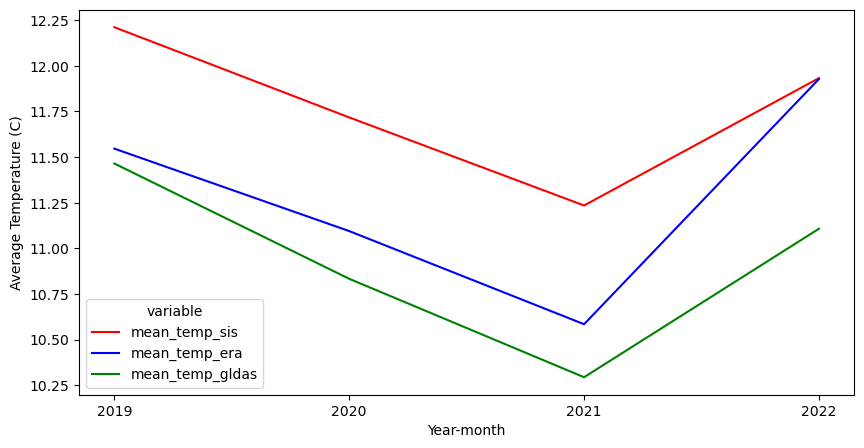

In [14]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y, ['y']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Average Temperature (C)')

Text(0, 0.5, 'Average Temp Diff (C)')

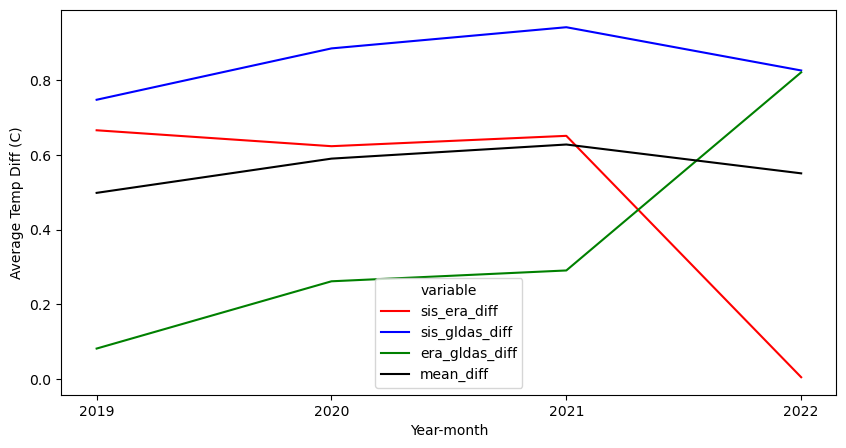

In [15]:
srb_1_avg_gb_y['sis_era_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis'] - srb_1_avg_gb_y['mean_temp_era'])
srb_1_avg_gb_y['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis'] - srb_1_avg_gb_y['mean_temp_gldas'])
srb_1_avg_gb_y['era_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_era'] - srb_1_avg_gb_y['mean_temp_gldas'])
srb_1_avg_gb_y['mean_diff'] = np.mean(srb_1_avg_gb_y[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y.drop(['mean_temp_sis', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['y']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Average Temp Diff (C)')

In [16]:
srb_1_avg_gb_y_prov = srb_1_avg.groupby(['GID_1', 'y']).agg({'mean_temp_sis': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,SRB.10_1,2019,12.217123,11.255581,11.520544
1,SRB.10_1,2020,11.607773,10.667727,10.727921
2,SRB.10_1,2021,11.169748,10.185808,10.195521
3,SRB.10_1,2022,11.840211,11.798883,11.079586
4,SRB.11_1,2019,10.203650,11.673354,11.934785


In [17]:
srb_1_avg_gb_y_prov['sis_era_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis'] - srb_1_avg_gb_y_prov['mean_temp_era'])
srb_1_avg_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_era'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['mean_diff'] = np.mean(srb_1_avg_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_1_avg_gb_y_prov[['mean_diff']].describe()

,mean_diff
count,100.000000
mean,1.441998
std,0.971676
min,0.037500
25%,0.506873
50%,1.274451
75%,2.271027
max,3.544745


In [18]:
srb_1_avg_gb_ym = srb_1_avg.groupby(['ym']).agg({'mean_temp_sis': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_ym.head()

,ym,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,2019-01,-1.683906,-2.054514,-2.165113
1,2019-02,2.542152,2.001567,2.290868
2,2019-03,7.808158,6.864476,7.773003
3,2019-04,11.764800,10.996506,10.708491
4,2019-05,13.631168,12.883262,12.081800


Text(0, 0.5, 'Average Temperature (C)')

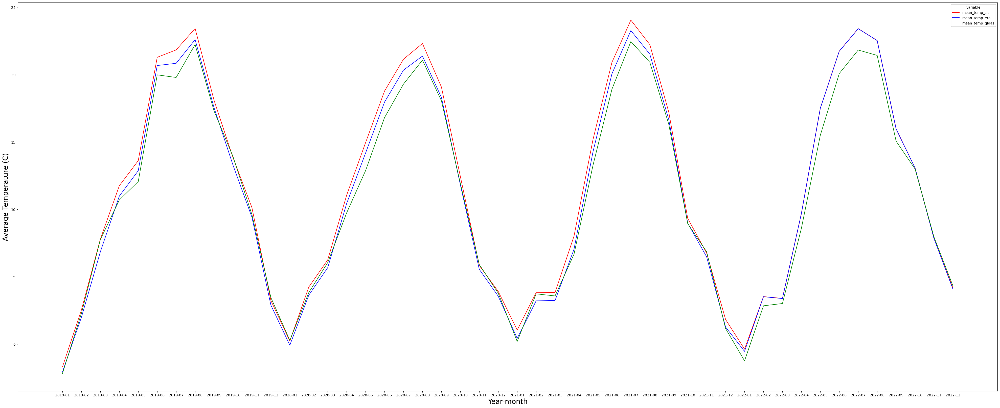

In [19]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

Text(0, 0.5, 'Mean Temp Diff (C)')

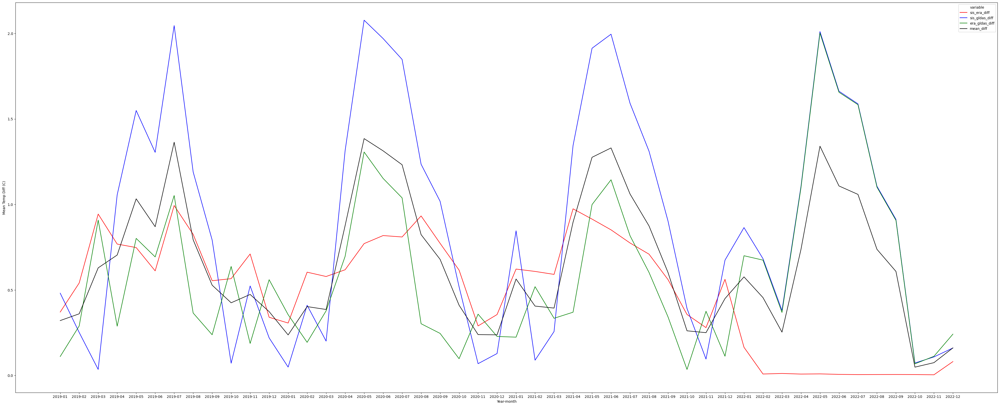

In [93]:
srb_1_avg_gb_ym['sis_era_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis'] - srb_1_avg_gb_ym['mean_temp_era'])
srb_1_avg_gb_ym['sis_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['era_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_era'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['mean_diff'] = np.mean(srb_1_avg_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym.drop(['mean_temp_sis', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

In [92]:
srb_1_avg_gb_ym.head()

,ym,mean_temp_sis,mean_temp_era,mean_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
0,2019-01,-1.683906,-2.054514,-2.165113,0.370608,0.481207,0.110599,0.370608
1,2019-02,2.542152,2.001567,2.290868,0.540585,0.251284,0.289301,0.540585
2,2019-03,7.808158,6.864476,7.773003,0.943682,0.035155,0.908528,0.943682
3,2019-04,11.764800,10.996506,10.708491,0.768294,1.056309,0.288015,0.768294
4,2019-05,13.631168,12.883262,12.081800,0.747906,1.549368,0.801462,0.747906


### Max Temp

In [20]:
srb_1_max = pd.read_csv('SRB_1_max_temp.csv')
srb_1_max['ym'] = srb_1_max['date'].str[:7]
srb_1_max['y'] = srb_1_max['date'].str[:4]

srb_1_max.head()

,GID_1,NAME_1,max_temp_sis,date,max_temp_era,max_temp_gldas,ym,y
0,SRB.1_1,Borski,4.600800,2019-01-01,3.019690,4.426965,2019-01,2019
1,SRB.2_1,Braničevski,3.122864,2019-01-01,2.452646,2.408105,2019-01,2019
2,SRB.3_1,GradBeograd,3.442963,2019-01-01,2.779362,4.326959,2019-01,2019
3,SRB.4_1,Jablanički,4.995758,2019-01-01,2.466877,2.956964,2019-01,2019
4,SRB.5_1,Južno-Bački,4.334839,2019-01-01,3.964084,4.736963,2019-01,2019


In [21]:
srb_1_max_gb_y = srb_1_max.groupby(['y']).agg({'max_temp_sis': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()

srb_1_max_gb_y

,y,max_temp_sis,max_temp_era,max_temp_gldas
0,2019,37.931061,36.946902,39.614008
1,2020,37.227478,36.474219,39.239526
2,2021,40.053223,39.172328,41.521417
3,2022,38.951233,38.053276,41.522974


Text(0, 0.5, 'Max Temperature (C)')

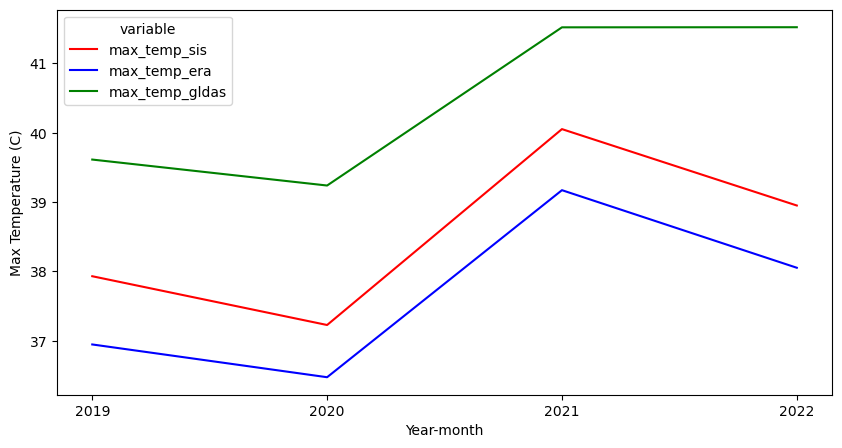

In [23]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_y, ['y']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Max Temperature (C)')

Text(0, 0.5, 'Mean Temp Diff (C)')

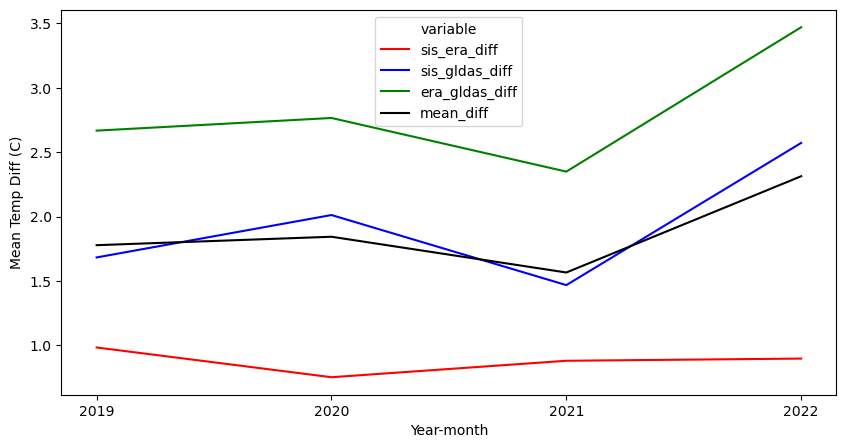

In [24]:
srb_1_max_gb_y['sis_era_diff'] = np.abs(srb_1_max_gb_y['max_temp_sis'] - srb_1_max_gb_y['max_temp_era'])
srb_1_max_gb_y['sis_gldas_diff'] = np.abs(srb_1_max_gb_y['max_temp_sis'] - srb_1_max_gb_y['max_temp_gldas'])
srb_1_max_gb_y['era_gldas_diff'] = np.abs(srb_1_max_gb_y['max_temp_era'] - srb_1_max_gb_y['max_temp_gldas'])
srb_1_max_gb_y['mean_diff'] = np.mean(srb_1_max_gb_y[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_y.drop(['max_temp_sis', 'max_temp_era', 'max_temp_gldas'], axis=1), ['y']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

In [25]:
srb_1_max_gb_y_prov = srb_1_max.groupby(['GID_1', 'y']).agg({'max_temp_sis': 'mean',
                                                             'max_temp_era': 'mean',
                                                             'max_temp_gldas': 'mean'}).reset_index()
srb_1_max_gb_y_prov.head()                                                             

,GID_1,y,max_temp_sis,max_temp_era,max_temp_gldas
0,SRB.10_1,2019,18.867118,17.297061,18.776414
1,SRB.10_1,2020,17.952578,16.519350,17.757569
2,SRB.10_1,2021,17.516233,16.004607,17.512042
3,SRB.10_1,2022,18.166632,16.738766,18.592676
4,SRB.11_1,2019,17.989057,15.085692,18.426902


In [26]:
srb_1_max_gb_y_prov['sis_era_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis'] - srb_1_max_gb_y_prov['max_temp_era'])
srb_1_max_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis'] - srb_1_max_gb_y_prov['max_temp_gldas'])
srb_1_max_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_era'] - srb_1_max_gb_y_prov['max_temp_gldas'])
srb_1_max_gb_y_prov['mean_diff'] = np.mean(srb_1_max_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_1_max_gb_y_prov[['mean_diff']].describe()

,mean_diff
count,100.000000
mean,1.401088
std,0.747603
min,0.240678
25%,0.955327
50%,1.334576
75%,1.818464
max,3.465922


In [27]:
srb_1_max_gb_ym = srb_1_max.groupby(['ym']).agg({'max_temp_sis': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_ym.head()

,ym,max_temp_sis,max_temp_era,max_temp_gldas
0,2019-01,11.601898,11.106968,10.860071
1,2019-02,17.484833,16.894289,18.904504
2,2019-03,22.483429,21.930151,23.564874
3,2019-04,30.982208,30.517270,29.412073
4,2019-05,27.677582,25.982170,26.819543


Text(0, 0.5, 'Max Temperature (C)')

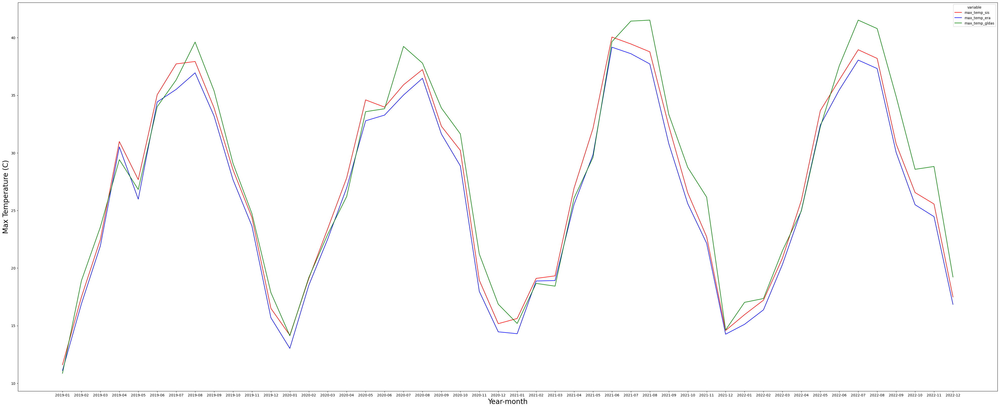

In [28]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

Text(0, 0.5, 'Mean Temp Diff (C)')

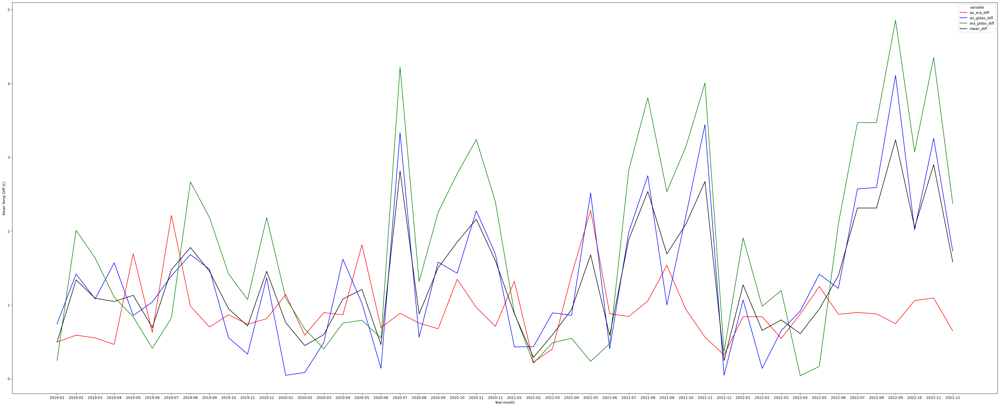

In [29]:
srb_1_max_gb_ym['sis_era_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis'] - srb_1_max_gb_ym['max_temp_era'])
srb_1_max_gb_ym['sis_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['era_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_era'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['mean_diff'] = np.mean(srb_1_max_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym.drop(['max_temp_sis', 'max_temp_era', 'max_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

## Level 2

### Avg Temp

In [30]:
srb_2_avg = pd.read_csv('SRB_2_mean_temp.csv')
srb_2_avg['ym'] = srb_2_avg['date'].str[:7]
srb_2_avg['y'] = srb_2_avg['date'].str[:4]

srb_2_avg.head()

,GID_2,GID_1,NAME_1,NAME_2,mean_temp_sis,date,mean_temp_era,mean_temp_gldas,ym,y
0,SRB.1.1_1,SRB.1_1,Borski,Bor,0.352314,2019-01-01,0.034522,-1.641046,2019-01,2019
1,SRB.1.2_1,SRB.1_1,Borski,Kladovo,-0.037094,2019-01-01,0.311551,0.961549,2019-01,2019
2,SRB.1.3_1,SRB.1_1,Borski,Majdanpek,-0.031573,2019-01-01,0.377383,-1.235660,2019-01,2019
3,SRB.1.4_1,SRB.1_1,Borski,Negotin,0.812155,2019-01-01,0.778047,0.465822,2019-01,2019
4,SRB.2.1_1,SRB.2_1,Braničevski,Golubac,0.684732,2019-01-01,0.407599,-1.536610,2019-01,2019


In [31]:
srb_2_avg_gb_y = srb_2_avg.groupby(['y']).agg({'mean_temp_sis': 'mean',
                                               'mean_temp_era': 'mean', 
                                               'mean_temp_gldas': 'mean'}).reset_index()

srb_2_avg_gb_y

,y,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,2019,12.364417,11.484585,11.369427
1,2020,11.862826,11.041464,10.726749
2,2021,11.382381,10.543962,10.180543
3,2022,12.076456,12.123818,11.002236


Text(0, 0.5, 'Average Temperature (C)')

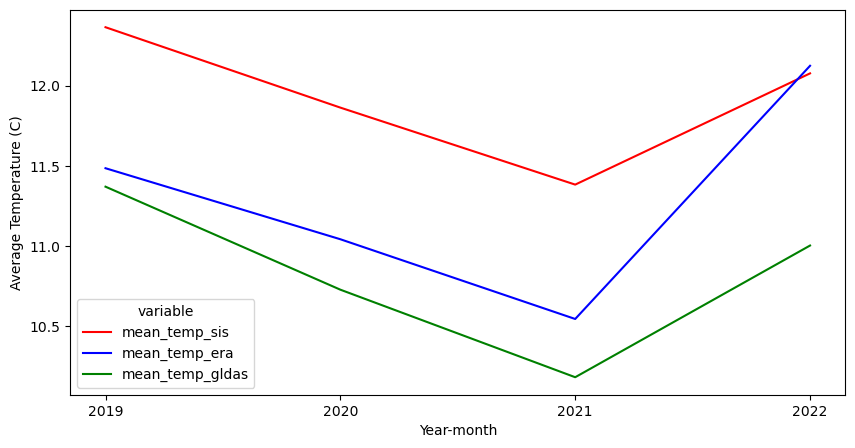

In [32]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_2_avg_gb_y, ['y']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Average Temperature (C)')

In [33]:
srb_2_avg_gb_ym = srb_2_avg.groupby(['ym']).agg({'mean_temp_sis': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()

srb_2_avg_gb_ym.head()

,ym,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,2019-01,-1.599255,-2.103529,-2.291737
1,2019-02,2.678745,1.945327,2.209411
2,2019-03,7.966620,6.783702,7.670987
3,2019-04,11.939313,11.004261,10.699928
4,2019-05,13.741610,12.797257,11.984088


Text(0, 0.5, 'Average Temperature (C)')

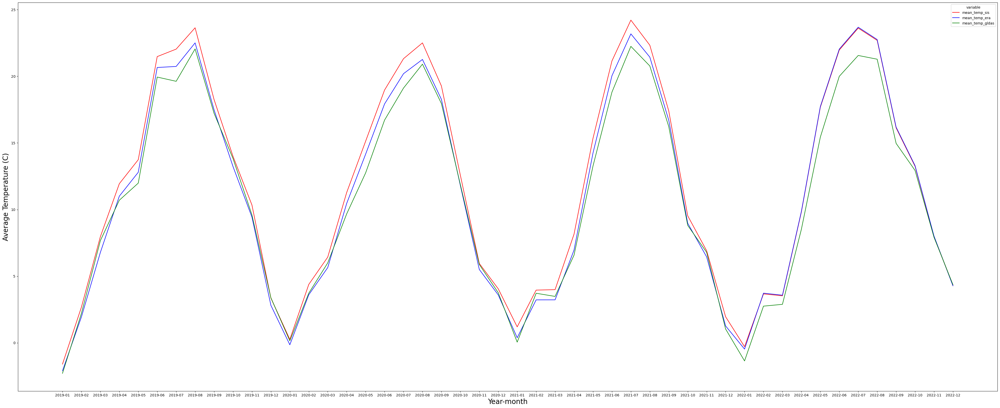

In [34]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_2_avg_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

In [35]:
srb_2_avg_gb_y_prov = srb_2_avg.groupby(['GID_1', 'y']).agg({'mean_temp_sis': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_2_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis,mean_temp_era,mean_temp_gldas
0,SRB.10_1,2019,12.293906,11.388983,11.597840
1,SRB.10_1,2020,11.654364,10.773738,10.789451
2,SRB.10_1,2021,11.220538,10.300848,10.269596
3,SRB.10_1,2022,11.888469,11.877084,11.156366
4,SRB.11_1,2019,10.280276,11.707796,11.936442


In [36]:
srb_2_avg_gb_y_prov['sis_era_diff'] = np.abs(srb_2_avg_gb_y_prov['mean_temp_sis'] - srb_2_avg_gb_y_prov['mean_temp_era'])
srb_2_avg_gb_y_prov['sis_gldas_diff'] = np.abs(srb_2_avg_gb_y_prov['mean_temp_sis'] - srb_2_avg_gb_y_prov['mean_temp_gldas'])
srb_2_avg_gb_y_prov['era_gldas_diff'] = np.abs(srb_2_avg_gb_y_prov['mean_temp_era'] - srb_2_avg_gb_y_prov['mean_temp_gldas'])
srb_2_avg_gb_y_prov['mean_diff'] = np.mean(srb_2_avg_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_2_avg_gb_y_prov[['mean_diff']].describe()

,mean_diff
count,100.000000
mean,1.442895
std,1.022672
min,0.018363
25%,0.538105
50%,1.152815
75%,2.274600
max,3.468562


### Max Temp

In [37]:
srb_2_max = pd.read_csv('SRB_2_max_temp.csv')
srb_2_max['ym'] = srb_2_max['date'].str[:7]
srb_2_max['y'] = srb_2_max['date'].str[:4]

srb_2_max.head()

,GID_2,GID_1,NAME_1,NAME_2,max_temp_sis,date,max_temp_era,max_temp_gldas,ym,y
0,SRB.1.1_1,SRB.1_1,Borski,Bor,3.587891,2019-01-01,3.588190,3.246942,2019-01,2019
1,SRB.1.2_1,SRB.1_1,Borski,Kladovo,4.000397,2019-01-01,4.556741,4.416956,2019-01,2019
2,SRB.1.3_1,SRB.1_1,Borski,Majdanpek,3.318756,2019-01-01,3.478616,3.536951,2019-01,2019
3,SRB.1.4_1,SRB.1_1,Borski,Negotin,4.600800,2019-01-01,4.876230,4.426965,2019-01,2019
4,SRB.2.1_1,SRB.2_1,Braničevski,Golubac,3.092590,2019-01-01,3.091898,1.866937,2019-01,2019


In [38]:
srb_2_max_gb_ym = srb_2_max.groupby(['ym']).agg({'max_temp_sis': 'max',
                                               'max_temp_era': 'max',
                                               'max_temp_gldas': 'max'}).reset_index()

srb_2_max_gb_ym.head()

,ym,max_temp_sis,max_temp_era,max_temp_gldas
0,2019-01,11.601898,11.978891,10.860071
1,2019-02,17.484833,17.485284,18.904504
2,2019-03,22.483429,22.483560,23.564874
3,2019-04,30.982208,30.762155,29.412073
4,2019-05,27.677582,27.804346,26.819543


Text(0, 0.5, 'Max Temperature (C)')

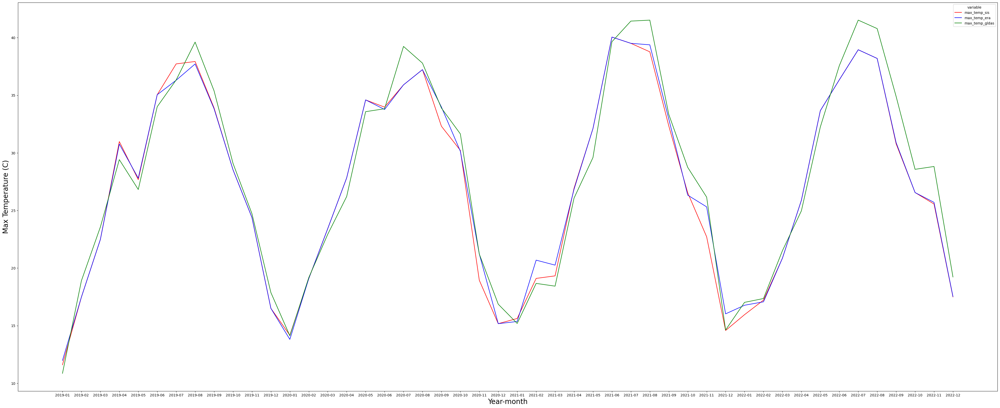

In [39]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_2_max_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

In [40]:
srb_2_max_gb_y_prov = srb_2_max.groupby(['GID_1', 'y']).agg({'max_temp_sis': 'max',
                                                             'max_temp_era': 'max',
                                                             'max_temp_gldas': 'max'}).reset_index()
srb_2_max_gb_y_prov.head()                                                             

,GID_1,y,max_temp_sis,max_temp_era,max_temp_gldas
0,SRB.10_1,2019,37.722290,35.210519,36.918970
1,SRB.10_1,2020,34.851379,34.371698,36.735620
2,SRB.10_1,2021,38.178802,37.312158,40.516412
3,SRB.10_1,2022,37.010925,37.547266,40.282983
4,SRB.11_1,2019,36.328522,34.783182,37.365015


In [41]:
srb_2_max_gb_y_prov['sis_era_diff'] = np.abs(srb_2_max_gb_y_prov['max_temp_sis'] - srb_2_max_gb_y_prov['max_temp_era'])
srb_2_max_gb_y_prov['sis_gldas_diff'] = np.abs(srb_2_max_gb_y_prov['max_temp_sis'] - srb_2_max_gb_y_prov['max_temp_gldas'])
srb_2_max_gb_y_prov['era_gldas_diff'] = np.abs(srb_2_max_gb_y_prov['max_temp_era'] - srb_2_max_gb_y_prov['max_temp_gldas'])
srb_2_max_gb_y_prov['mean_diff'] = np.mean(srb_2_max_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_2_max_gb_y_prov[['mean_diff']].describe()

,mean_diff
count,100.000000
mean,1.561658
std,0.647835
min,0.051213
25%,1.152761
50%,1.432420
75%,1.922893
max,3.896704


# Uzbekistan

## Level 1

### Avg Temp

In [3]:
srb_1_avg = pd.read_csv('/Users/sonle/Documents/work/WB/GED/validation/UZB_1_mean_temp.csv')
srb_1_avg['ym'] = srb_1_avg['date'].str[:7]
srb_1_avg['y'] = srb_1_avg['date'].str[:4]

srb_1_avg.head()

,GID_1,NAME_1,mean_temp_sis,date,mean_temp_era,mean_temp_gldas,mean_temp_sis_gpbp,ym,y
0,UZB.1_1,Andijon,2.751321,2019-01-01,-9.062138,5.062056,2.751321,2019-01,2019
1,UZB.2_1,Buxoro,0.971025,2019-01-01,-4.349333,2.929842,0.971025,2019-01,2019
2,UZB.3_1,Farg'ona,4.130012,2019-01-01,-8.042116,4.828897,4.130012,2019-01,2019
3,UZB.4_1,Jizzax,1.984608,2019-01-01,-0.489491,2.745893,1.984608,2019-01,2019
4,UZB.8_1,Namangan,1.678300,2019-01-01,-7.839324,3.315945,1.678300,2019-01,2019


In [4]:
srb_1_avg_gb_y = srb_1_avg.groupby(['y']).agg({'mean_temp_sis': 'mean',
                                               'mean_temp_sis_gpbp': 'mean',
                                               'mean_temp_era': 'mean',
                                               'mean_temp_gldas': 'mean'}).reset_index()

srb_1_avg_gb_y

,y,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019,14.793787,14.794335,12.567994,13.873270
1,2020,13.721052,13.721344,11.622483,12.698126
2,2021,10.345568,14.884448,12.338121,13.768741
3,2022,5.320341,14.949324,12.754306,14.283984


Text(0, 0.5, 'Average Temperature (C)')

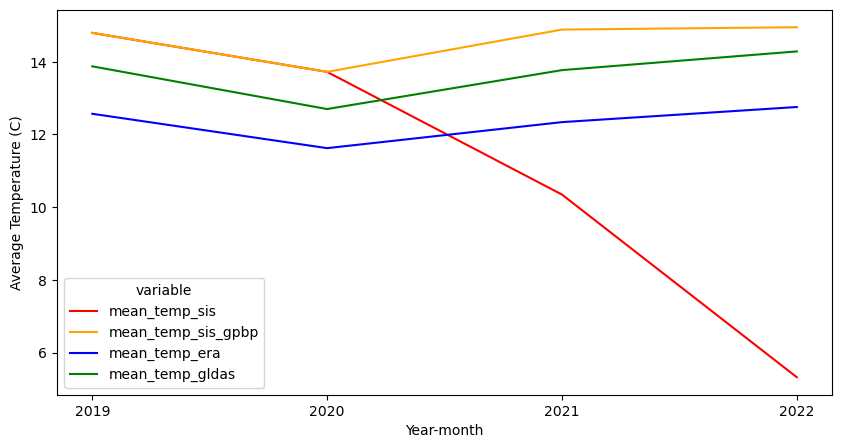

In [5]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y, ['y']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Average Temperature (C)')

In [6]:
# srb_1_avg_gb_y['sis_era_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis'] - srb_1_avg_gb_y['mean_temp_era'])
# srb_1_avg_gb_y['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis'] - srb_1_avg_gb_y['mean_temp_gldas'])
# srb_1_avg_gb_y['era_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_era'] - srb_1_avg_gb_y['mean_temp_gldas'])
# srb_1_avg_gb_y['mean_diff'] = np.mean(srb_1_avg_gb_y[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

# fig = plt.figure(figsize=[10, 5])
# sns.lineplot(x='y', y='value', hue='variable',
#              data=pd.melt(srb_1_avg_gb_y.drop(['mean_temp_sis', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['y']),
#              palette=['red', 'blue', 'green', 'black'])
# plt.xlabel('Year-month')
# plt.ylabel('Mean Temp Diff (C)')

In [7]:
srb_1_avg_gb_y_prov = srb_1_avg.groupby(['GID_1', 'y']).agg({'mean_temp_sis': 'mean',
                                                             'mean_temp_sis_gpbp': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,UZB.10_1,2019,14.607002,14.607002,15.439050,16.341653
1,UZB.10_1,2020,13.383746,13.383746,14.145990,14.971548
2,UZB.10_1,2021,10.142984,15.015170,14.983149,15.957822
3,UZB.10_1,2022,4.884828,14.997936,15.246741,16.522348
4,UZB.11_1,2019,17.106336,17.110361,16.076645,16.829069


In [8]:
# srb_1_avg_gb_y_prov['sis_era_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis'] - srb_1_avg_gb_y_prov['mean_temp_era'])
# srb_1_avg_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis'] - srb_1_aavg_gb_y_prov['mean_temp_gldas'])
# srb_1_avg_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_era'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
# srb_1_avg_gb_y_prov['mean_diff'] = np.mean(srb_1_avg_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
# srb_1_avg_gb_y_prov[['mean_diff']].describe()

In [9]:
srb_1_avg_gb_ym = srb_1_avg.groupby(['ym']).agg({'mean_temp_sis': 'mean',
                                                 'mean_temp_sis_gpbp': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_ym.head()




,ym,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019-01,2.389201,2.390865,-0.496081,1.096178
1,2019-02,2.942704,2.943701,0.262648,1.158510
2,2019-03,9.770553,9.770949,7.613489,9.833900
3,2019-04,14.512296,14.512254,12.559048,14.152808
4,2019-05,21.183152,21.183328,19.419051,20.918492


Text(0, 0.5, 'Average Temperature (C)')

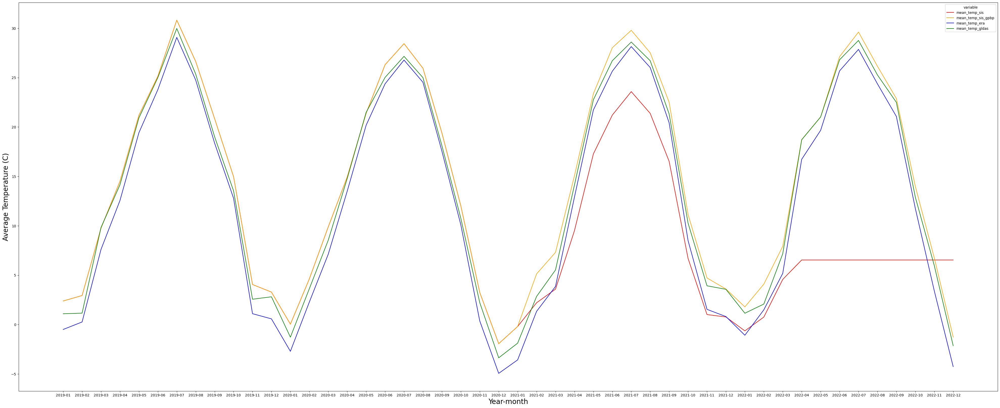

In [10]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym, ['ym']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

In [11]:
srb_1_avg_gb_ym[srb_1_avg_gb_ym['ym'].between('2022-01', '2022-12')]

,ym,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
36,2022-01,-0.636357,1.794037,-1.079342,1.149845
37,2022-02,0.760687,4.094190,1.489722,2.078003
38,2022-03,4.573042,7.925980,5.185523,7.172026
39,2022-04,6.540321,18.720445,16.730591,18.709053
40,2022-05,6.540321,21.024663,19.663055,21.019520
41,2022-06,6.540321,27.124542,25.680016,26.806464
42,2022-07,6.540321,29.618895,27.859932,28.767683
43,2022-08,6.540321,26.156079,24.373467,25.274483
44,2022-09,6.540321,22.885557,21.073355,22.498394
45,2022-10,6.540321,13.997978,11.770571,12.910557


In [12]:
# srb_1_avg_gb_ym['sis_era_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis'] - srb_1_avg_gb_ym['mean_temp_era'])
# srb_1_avg_gb_ym['sis_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis'] - srb_1_avg_gb_ym['mean_temp_gldas'])
# srb_1_avg_gb_ym['era_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_era'] - srb_1_avg_gb_ym['mean_temp_gldas'])
# srb_1_avg_gb_ym['mean_diff'] = np.mean(srb_1_avg_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)


In [13]:
# fig = plt.figure(figsize=[50, 20])
# sns.lineplot(x='ym', y='value', hue='variable',
#              data=pd.melt(srb_1_avg_gb_ym.drop(['mean_temp_sis', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['ym']),
#              palette=['red', 'blue', 'green', 'black'])
# plt.xlabel('Year-month')
# plt.ylabel('Mean Temp Diff (C)')
# srb_1_avg_gb_ym.head()

In [14]:
srb_1_avg_gb_ym[srb_1_avg_gb_ym['ym'].between('2022-01', '2022-12')]

,ym,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
36,2022-01,-0.636357,1.794037,-1.079342,1.149845
37,2022-02,0.760687,4.094190,1.489722,2.078003
38,2022-03,4.573042,7.925980,5.185523,7.172026
39,2022-04,6.540321,18.720445,16.730591,18.709053
40,2022-05,6.540321,21.024663,19.663055,21.019520
41,2022-06,6.540321,27.124542,25.680016,26.806464
42,2022-07,6.540321,29.618895,27.859932,28.767683
43,2022-08,6.540321,26.156079,24.373467,25.274483
44,2022-09,6.540321,22.885557,21.073355,22.498394
45,2022-10,6.540321,13.997978,11.770571,12.910557


### Max Temp

In [15]:
srb_1_max = pd.read_csv('UZB_1_max_temp.csv')
srb_1_max['ym'] = srb_1_max['date'].str[:7]
srb_1_max['y'] = srb_1_max['date'].str[:4]

srb_1_max.head()

,GID_1,NAME_1,max_temp_sis,date,max_temp_era,max_temp_gldas,max_temp_sis_gpbp,ym,y
0,UZB.1_1,Andijon,9.289429,2019-01-01,-0.897375,4.026941,9.289429,2019-01,2019
1,UZB.2_1,Buxoro,7.145782,2019-01-01,3.575220,4.066919,7.145782,2019-01,2019
2,UZB.3_1,Farg'ona,9.459839,2019-01-01,4.442468,3.026941,9.459839,2019-01,2019
3,UZB.4_1,Jizzax,8.238312,2019-01-01,5.010828,4.906946,8.238312,2019-01,2019
4,UZB.8_1,Namangan,10.079376,2019-01-01,9.813562,10.306940,10.079376,2019-01,2019


In [16]:
srb_1_max_gb_y = srb_1_max.groupby(['y']).agg({'max_temp_sis': 'max',
                                               'max_temp_sis_gpbp': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_y

,y,max_temp_sis,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019,47.019012,47.019012,47.074976,48.474481
1,2020,45.278107,45.278107,45.679971,46.259271
2,2021,47.791412,47.791412,47.790872,47.676416
3,2022,28.947784,47.323914,47.949197,47.391412


Text(0, 0.5, 'Max Temperature (C)')

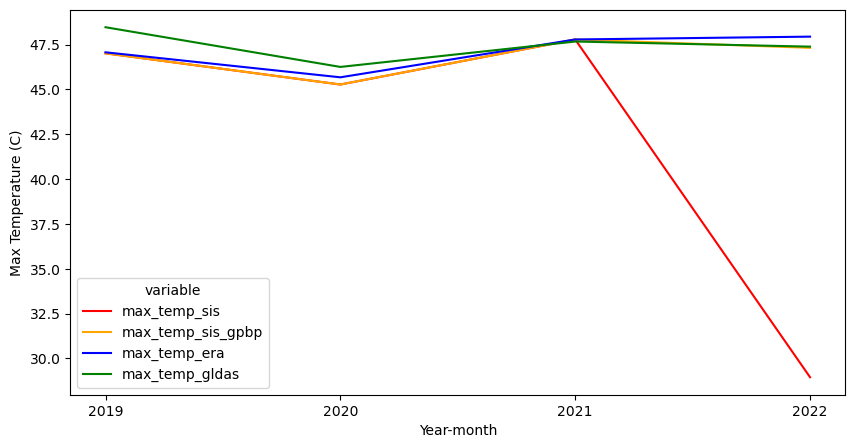

In [17]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_y, ['y']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Max Temperature (C)')

In [18]:
# srb_1_max_gb_y['sis_era_diff'] = np.abs(srb_1_max_gb_y['max_temp_sis'] - srb_1_max_gb_y['max_temp_era'])
# srb_1_max_gb_y['sis_gldas_diff'] = np.abs(srb_1_max_gb_y['max_temp_sis'] - srb_1_max_gb_y['max_temp_gldas'])
# srb_1_max_gb_y['era_gldas_diff'] = np.abs(srb_1_max_gb_y['max_temp_era'] - srb_1_max_gb_y['max_temp_gldas'])
# srb_1_max_gb_y['mean_diff'] = np.mean(srb_1_max_gb_y[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
# fig = plt.figure(figsize=[10, 5])
# sns.lineplot(x='y', y='value', hue='variable',
#              data=pd.melt(srb_1_max_gb_y.drop(['max_temp_sis', 'max_temp_era', 'max_temp_gldas'], axis=1), ['y']),
#              palette=['red', 'blue', 'green', 'black'])
# plt.xlabel('Year-month')
# plt.ylabel('Mean Temp Diff (C)')

In [20]:
srb_1_max_gb_y_prov = srb_1_max.groupby(['GID_1', 'y']).agg({'max_temp_sis': 'max',
                                                             'max_temp_sis_gpbp': 'max',
                                                             'max_temp_era': 'max',
                                                             'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_y_prov.head() 

,GID_1,y,max_temp_sis,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,UZB.10_1,2019,44.472626,44.472626,44.619241,45.170038
1,UZB.10_1,2020,42.783966,42.783966,43.317270,42.654504
2,UZB.10_1,2021,46.324921,46.324921,46.325616,46.426416
3,UZB.10_1,2022,28.131592,45.887329,45.787637,45.833002
4,UZB.11_1,2019,44.482300,44.482300,44.771585,45.641382


In [21]:
# srb_1_max_gb_y_prov['sis_era_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis'] - srb_1_max_gb_y_prov['max_temp_era'])
# srb_1_max_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis'] - srb_1_max_gb_y_prov['max_temp_gldas'])
# srb_1_max_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_era'] - srb_1_max_gb_y_prov['max_temp_gldas'])
# srb_1_max_gb_y_prov['mean_diff'] = np.mean(srb_1_max_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
# srb_1_max_gb_y_prov[['mean_diff']].describe()

In [22]:
srb_1_max_gb_ym = srb_1_max.groupby(['ym']).agg({'max_temp_sis': 'max',
                                                 'max_temp_sis_gpbp': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_ym.head()

,ym,max_temp_sis,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019-01,21.367767,21.367767,24.761697,23.947198
1,2019-02,18.772583,18.772583,20.360498,21.349756
2,2019-03,28.913666,28.913666,29.219110,29.540216
3,2019-04,33.029449,33.029449,32.639658,32.995294
4,2019-05,38.538361,38.538361,39.507639,38.894556


Text(0, 0.5, 'Max Temperature (C)')

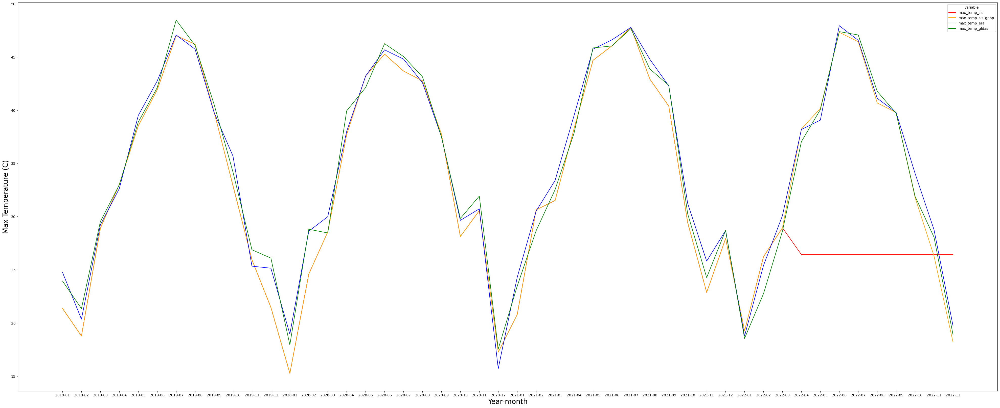

In [23]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym, ['ym']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

In [62]:
srb_1_max_gb_ym['sis_era_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis'] - srb_1_max_gb_ym['max_temp_era'])
srb_1_max_gb_ym['sis_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['era_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_era'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['mean_diff'] = np.mean(srb_1_max_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

Text(0, 0.5, 'Mean Temp Diff (C)')

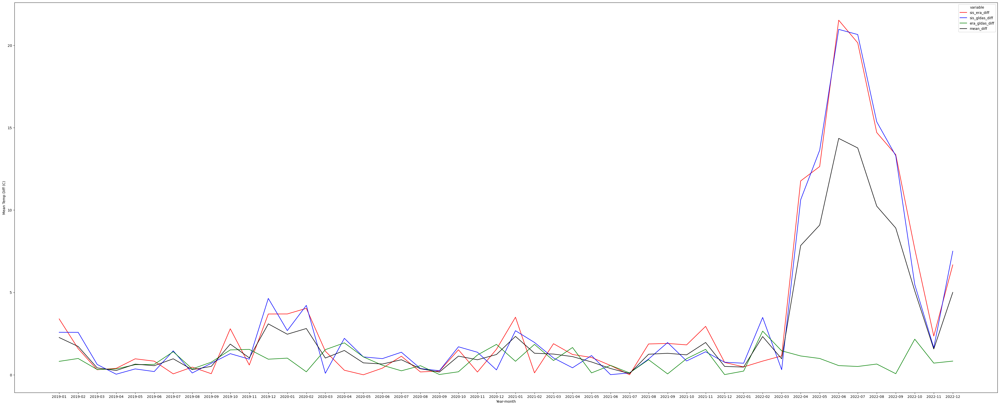

In [63]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym.drop(['max_temp_sis', 'max_temp_era', 'max_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

## Level 2

### Avg Temp

In [4]:
srb_1_avg = pd.read_csv('/Users/sonle/Documents/work/WB/GED/validation/UZB_2_mean_temp.csv')
srb_1_avg['ym'] = srb_1_avg['date'].str[:7]
srb_1_avg['y'] = srb_1_avg['date'].str[:4]

srb_1_avg.head()

,GID_2,GID_1,NAME_1,NAME_2,mean_temp_sis,date,mean_temp_era,mean_temp_gldas,mean_temp_sis_gpbp,ym,y
0,UZB.1.1_1,UZB.1_1,Andijon,Andijon,2.323555,2019-01-01,-7.444972,5.404798,2.323555,2019-01,2019
1,UZB.1.2_1,UZB.1_1,Andijon,Asaka,3.111832,2019-01-01,-10.092160,5.164168,3.111832,2019-01,2019
2,UZB.1.3_1,UZB.1_1,Andijon,Baliqchi,3.594788,2019-01-01,-8.098240,5.963426,3.594788,2019-01,2019
3,UZB.1.4_1,UZB.1_1,Andijon,Bo'zsuv,3.635162,2019-01-01,-10.859145,5.061170,3.635162,2019-01,2019
4,UZB.1.5_1,UZB.1_1,Andijon,Buloqboshi,1.969299,2019-01-01,-10.958612,4.791161,1.969299,2019-01,2019


In [5]:
srb_1_avg_gb_y = srb_1_avg.groupby(['y']).agg({'mean_temp_sis': 'mean',
                                               'mean_temp_sis_gpbp': 'mean',
                                               'mean_temp_era': 'mean',
                                               'mean_temp_gldas': 'mean'}).reset_index()

srb_1_avg_gb_y

,y,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019,15.304685,15.304809,12.304672,13.659613
1,2020,14.233961,14.233986,11.404347,12.536157
2,2021,10.668811,15.398335,11.982870,13.543165
3,2022,5.596820,15.506921,12.522119,14.216710


Text(0, 0.5, 'Average Temperature (C)')

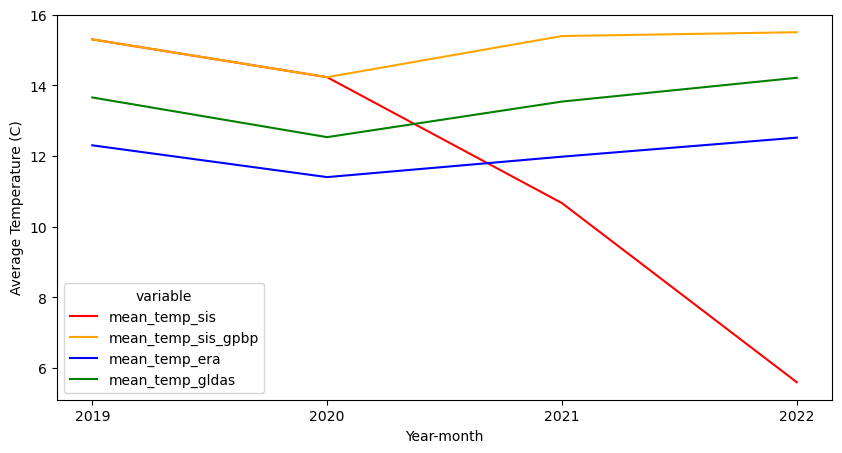

In [6]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y, ['y']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Average Temperature (C)')

In [7]:
srb_1_avg_gb_y_prov = srb_1_avg.groupby(['GID_1', 'y']).agg({'mean_temp_sis': 'mean',
                                                             'mean_temp_sis_gpbp': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,UZB.10_1,2019,14.067296,14.067296,15.427235,16.262252
1,UZB.10_1,2020,12.882650,12.882650,14.130252,14.898131
2,UZB.10_1,2021,9.522698,14.477662,14.994719,15.936360
3,UZB.10_1,2022,4.085220,14.464057,15.248941,16.427683
4,UZB.11_1,2019,17.179401,17.180538,16.048397,16.813660


In [8]:
srb_1_avg_gb_ym = srb_1_avg.groupby(['ym']).agg({'mean_temp_sis': 'mean',
                                                 'mean_temp_sis_gpbp': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_ym.head()




,ym,mean_temp_sis,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019-01,2.903339,2.903708,-0.928948,0.610758
1,2019-02,3.509758,3.510002,-0.083927,0.558444
2,2019-03,10.318091,10.318187,7.390601,9.832118
3,2019-04,15.064755,15.064704,12.450274,14.009743
4,2019-05,21.606692,21.606639,19.215466,20.679425


Text(0, 0.5, 'Average Temperature (C)')

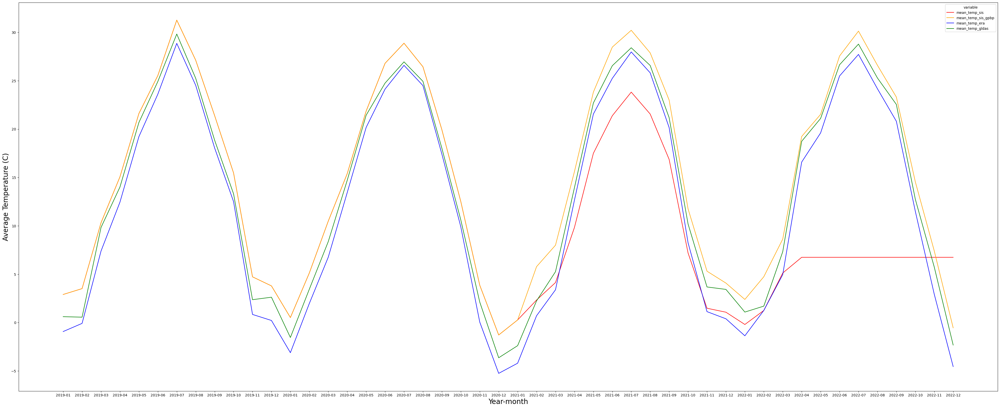

In [9]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym, ['ym']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

### Max Temp

In [10]:
srb_1_max = pd.read_csv('UZB_2_max_temp.csv')
srb_1_max['ym'] = srb_1_max['date'].str[:7]
srb_1_max['y'] = srb_1_max['date'].str[:4]

srb_1_max.head()

,GID_2,GID_1,NAME_1,NAME_2,max_temp_sis,date,max_temp_era,max_temp_gldas,max_temp_sis_gpbp,ym,y
0,UZB.1.1_1,UZB.1_1,Andijon,Andijon,8.580719,2019-01-01,-2.426672,-4.053076,8.580719,2019-01,2019
1,UZB.1.2_1,UZB.1_1,Andijon,Asaka,7.813080,2019-01-01,-5.301672,-5.863074,7.813080,2019-01,2019
2,UZB.1.3_1,UZB.1_1,Andijon,Baliqchi,9.289429,2019-01-01,-2.413000,-2.523077,9.289429,2019-01,2019
3,UZB.1.4_1,UZB.1_1,Andijon,Bo'zsuv,8.211243,2019-01-01,-6.776282,-2.523077,8.211243,2019-01,2019
4,UZB.1.5_1,UZB.1_1,Andijon,Buloqboshi,7.287537,2019-01-01,-5.301672,-7.733069,7.287537,2019-01,2019


In [11]:
srb_1_max_gb_y = srb_1_max.groupby(['y']).agg({'max_temp_sis': 'max',
                                               'max_temp_sis_gpbp': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_y

,y,max_temp_sis,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019,47.019012,47.019012,47.074976,48.474481
1,2020,45.278107,45.278107,45.679971,46.259271
2,2021,47.791412,47.791412,47.790872,47.676416
3,2022,28.947784,47.323914,47.949197,47.391412


Text(0, 0.5, 'Max Temperature (C)')

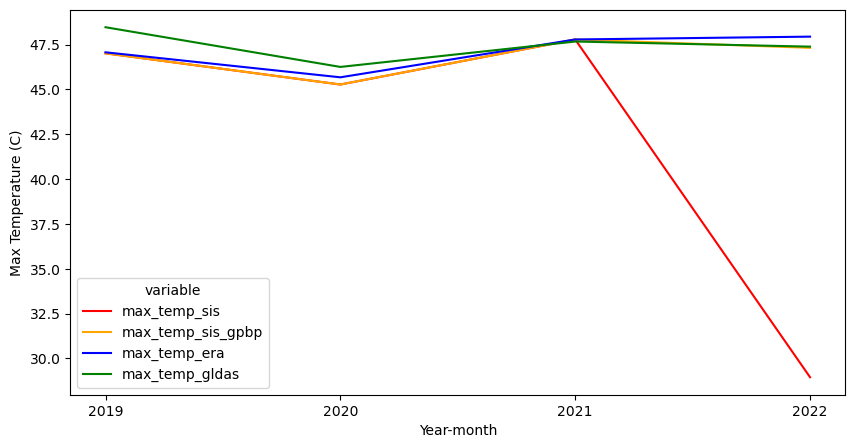

In [12]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_y, ['y']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Max Temperature (C)')

In [13]:
srb_1_max_gb_ym = srb_1_max.groupby(['ym']).agg({'max_temp_sis': 'max',
                                                 'max_temp_sis_gpbp': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_ym.head()

,ym,max_temp_sis,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019-01,21.367767,21.367767,24.761697,23.947198
1,2019-02,18.772583,18.772583,20.360498,21.349756
2,2019-03,28.913666,28.913666,29.219110,29.540216
3,2019-04,33.029449,33.029449,32.639658,32.995294
4,2019-05,38.538361,38.538361,39.507639,38.894556


Text(0, 0.5, 'Max Temperature (C)')

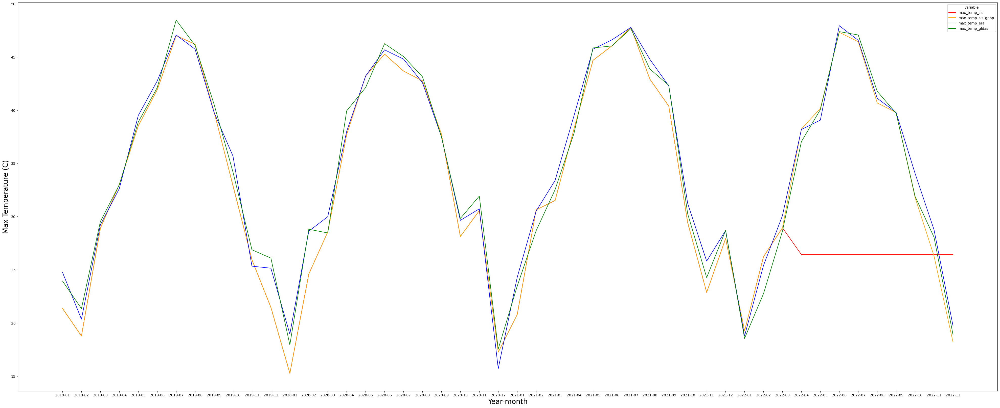

In [14]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym, ['ym']),
             palette=['red', 'orange', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

# Armenia

## Level 1

### Avg Temp

In [75]:
srb_1_avg = pd.read_csv('/Users/sonle/Documents/work/WB/GED/validation/ARM_1_mean_temp.csv')
srb_1_avg['ym'] = srb_1_avg['date'].str[:7]
srb_1_avg['y'] = srb_1_avg['date'].str[:4]

srb_1_avg.head()

,GID_1,NAME_1,mean_temp_sis_gpbp,date,mean_temp_era,mean_temp_gldas,ym,y
0,ARM.1_1,Aragatsotn,-7.533161,2019-01-01,-7.669438,-7.792120,2019-01,2019
1,ARM.2_1,Ararat,-4.580110,2019-01-01,-4.476223,-2.640945,2019-01,2019
2,ARM.3_1,Armavir,-2.861038,2019-01-01,-2.832906,0.221033,2019-01,2019
3,ARM.4_1,Erevan,-4.292175,2019-01-01,-3.946716,-0.769504,2019-01,2019
4,ARM.5_1,Gegharkunik,-7.859310,2019-01-01,-7.982477,-8.031468,2019-01,2019


In [76]:
srb_1_avg_gb_y = srb_1_avg.groupby(['y']).agg({
                                               'mean_temp_sis_gpbp': 'mean',
                                               'mean_temp_era': 'mean',
                                               'mean_temp_gldas': 'mean'}).reset_index()

srb_1_avg_gb_y

,y,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019,7.736207,7.772008,8.062549
1,2020,7.467266,7.505730,7.780760
2,2021,7.897247,7.932263,8.415788
3,2022,7.627304,7.697402,7.800740


Text(0, 0.5, 'Average Temperature (C)')

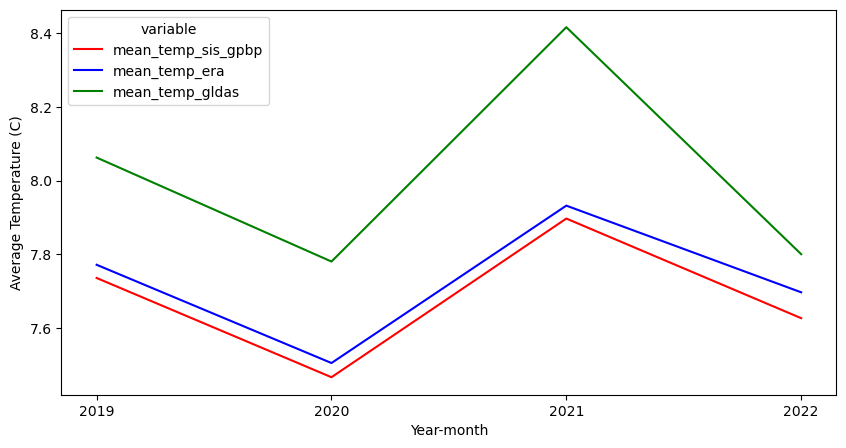

In [77]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y, ['y']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Average Temperature (C)')

Text(0, 0.5, 'Mean Temp Diff (C)')

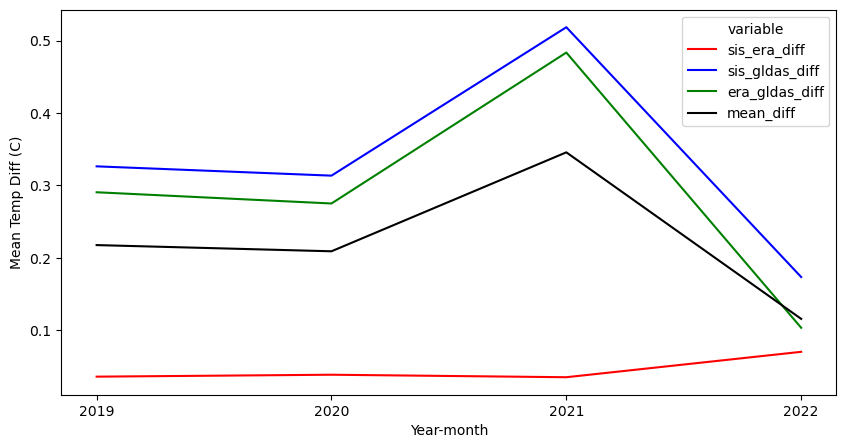

In [78]:
srb_1_avg_gb_y['sis_era_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis_gpbp'] - srb_1_avg_gb_y['mean_temp_era'])
srb_1_avg_gb_y['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_sis_gpbp'] - srb_1_avg_gb_y['mean_temp_gldas'])
srb_1_avg_gb_y['era_gldas_diff'] = np.abs(srb_1_avg_gb_y['mean_temp_era'] - srb_1_avg_gb_y['mean_temp_gldas'])
srb_1_avg_gb_y['mean_diff'] = np.mean(srb_1_avg_gb_y[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_y.drop(['mean_temp_sis_gpbp', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['y']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

In [79]:
srb_1_avg_gb_y_prov = srb_1_avg.groupby(['GID_1', 'y']).agg({
                                                             'mean_temp_sis_gpbp': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,ARM.10_1,2019,9.148478,9.154879,9.065772
1,ARM.10_1,2020,8.982093,8.997311,8.476566
2,ARM.10_1,2021,9.144384,9.160728,9.103344
3,ARM.10_1,2022,8.935892,8.976831,8.537576
4,ARM.11_1,2019,6.334436,6.272737,6.577423


In [81]:
srb_1_avg_gb_y_prov['sis_era_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis_gpbp'] - srb_1_avg_gb_y_prov['mean_temp_era'])
srb_1_avg_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis_gpbp'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_era'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['mean_diff'] = np.mean(srb_1_avg_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_1_avg_gb_y_prov.describe()

,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,7.682006,7.726851,8.014959,0.115646,0.953247,0.882846,0.650580
std,2.097771,2.170284,3.043628,0.103998,0.826983,0.745860,0.537921
min,5.005546,4.978453,4.095305,0.006402,0.013249,0.012723,0.038256
25%,5.924646,6.151927,5.895866,0.042478,0.343337,0.294301,0.244180
50%,6.881906,6.829677,6.533118,0.076524,0.646419,0.569591,0.430946
75%,9.251956,9.324443,11.345243,0.164021,1.557773,1.464596,1.038515
max,11.918236,12.015976,13.737156,0.380901,2.699809,2.384440,1.799872


In [82]:
srb_1_avg_gb_ym = srb_1_avg.groupby(['ym']).agg({
                                                 'mean_temp_sis_gpbp': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_ym.head()




,ym,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019-01,-4.787227,-4.764505,-3.977794
1,2019-02,-2.570020,-2.526218,-2.432186
2,2019-03,-0.067610,-0.027263,0.150054
3,2019-04,4.411560,4.450899,4.968535
4,2019-05,12.336144,12.377369,12.883519


Text(0, 0.5, 'Average Temperature (C)')

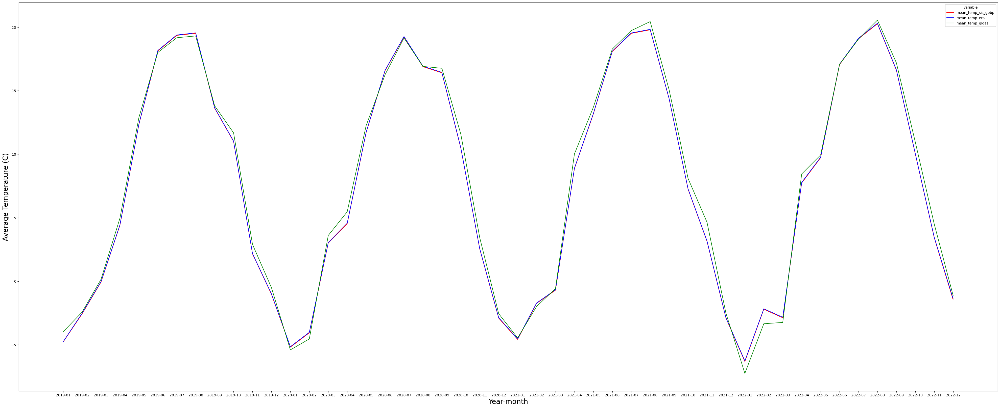

In [83]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

,ym,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
0,2019-01,-4.787227,-4.764505,-3.977794,0.022722,0.809432,0.786710,0.539622
1,2019-02,-2.570020,-2.526218,-2.432186,0.043802,0.137834,0.094032,0.091889
2,2019-03,-0.067610,-0.027263,0.150054,0.040347,0.217664,0.177317,0.145109
3,2019-04,4.411560,4.450899,4.968535,0.039339,0.556976,0.517636,0.371317
4,2019-05,12.336144,12.377369,12.883519,0.041224,0.547375,0.506151,0.364917


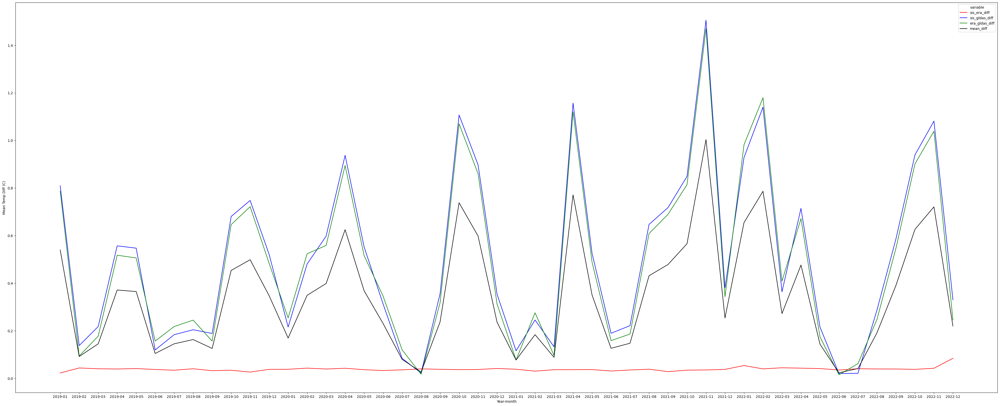

In [86]:
srb_1_avg_gb_ym['sis_era_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis_gpbp'] - srb_1_avg_gb_ym['mean_temp_era'])
srb_1_avg_gb_ym['sis_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis_gpbp'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['era_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_era'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['mean_diff'] = np.mean(srb_1_avg_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym.drop(['mean_temp_sis_gpbp', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')
srb_1_avg_gb_ym.head()


### Max Temp

In [63]:
srb_1_max = pd.read_csv('ARM_1_max_temp.csv')
srb_1_max['ym'] = srb_1_max['date'].str[:7]
srb_1_max['y'] = srb_1_max['date'].str[:4]

srb_1_max.head()

,GID_1,NAME_1,max_temp_sis_gpbp,date,max_temp_era,max_temp_gldas,ym,y
0,ARM.1_1,Aragatsotn,1.885406,2019-01-01,3.665063,4.396967,2019-01,2019
1,ARM.2_1,Ararat,4.059326,2019-01-01,2.598657,4.946954,2019-01,2019
2,ARM.3_1,Armavir,3.460510,2019-01-01,5.139673,4.396967,2019-01,2019
3,ARM.4_1,Erevan,-0.210449,2019-01-01,3.698267,3.886957,2019-01,2019
4,ARM.5_1,Gegharkunik,-2.016479,2019-01-01,5.542017,-0.743079,2019-01,2019


In [64]:
srb_1_max_gb_y = srb_1_max.groupby(['y']).agg({'max_temp_sis_gpbp': 'max',
                                               'max_temp_era': 'max', 
                                               'max_temp_gldas': 'max'}).reset_index()

srb_1_max_gb_y

,y,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019,39.550262,43.130151,42.208978
1,2020,37.539429,41.113702,40.473962
2,2021,38.122528,42.143167,41.010065
3,2022,38.494812,39.886224,40.791406


Text(0, 0.5, 'Max Temperature (C)')

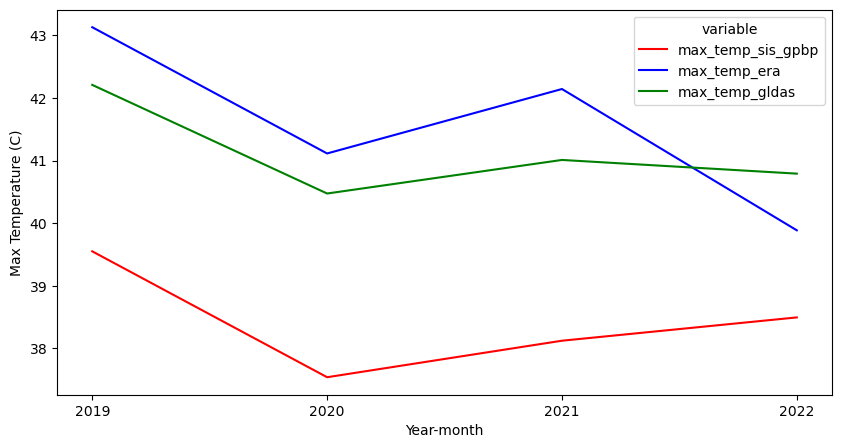

In [65]:
fig = plt.figure(figsize=[10, 5])
sns.lineplot(x='y', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_y, ['y']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month')
plt.ylabel('Max Temperature (C)')

In [66]:
srb_1_max_gb_y_prov = srb_1_max.groupby(['GID_1', 'y']).agg({
                                                             'max_temp_sis_gpbp': 'max',
                                                             'max_temp_era': 'max',
                                                             'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_y_prov.head() 

,GID_1,y,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,ARM.10_1,2019,36.068604,43.130151,38.149469
1,ARM.10_1,2020,37.038574,41.113702,38.233972
2,ARM.10_1,2021,37.527802,42.143167,40.550073
3,ARM.10_1,2022,36.837616,36.836877,38.876093
4,ARM.11_1,2019,35.472168,28.402841,38.788965


In [69]:
srb_1_max_gb_y_prov['sis_era_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis_gpbp'] - srb_1_max_gb_y_prov['max_temp_era'])
srb_1_max_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_sis_gpbp'] - srb_1_max_gb_y_prov['max_temp_gldas'])
srb_1_max_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_max_gb_y_prov['max_temp_era'] - srb_1_max_gb_y_prov['max_temp_gldas'])
srb_1_max_gb_y_prov['mean_diff'] = np.mean(srb_1_max_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_1_max_gb_y_prov.describe()

,max_temp_sis_gpbp,max_temp_era,max_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000
mean,35.181492,37.924148,38.345536,3.353192,3.335608,2.838554,3.175785
std,3.004434,3.468705,2.584040,3.586701,1.583711,2.281133,2.112080
min,27.213104,27.213312,32.983972,0.000739,0.507288,0.107697,0.605292
25%,34.057198,36.351511,36.404565,1.033849,2.246599,1.335800,1.936785
50%,36.009537,38.724313,38.832529,1.878946,3.200357,2.377792,2.636827
75%,37.093552,40.242197,40.492990,4.714964,4.099115,3.314251,3.403728
max,39.550262,43.130151,42.208978,14.239130,7.371606,10.386124,9.492753


In [70]:
srb_1_max_gb_ym = srb_1_max.groupby(['ym']).agg({
                                                 'max_temp_sis_gpbp': 'max',
                                                 'max_temp_era': 'max', 
                                                 'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_ym.head()

,ym,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019-01,13.823578,15.787088,16.780786
1,2019-02,13.434052,15.304971,17.123132
2,2019-03,18.643799,22.928888,22.403894
3,2019-04,23.012573,26.333612,25.700281
4,2019-05,30.409363,33.998087,33.921869


Text(0, 0.5, 'Max Temperature (C)')

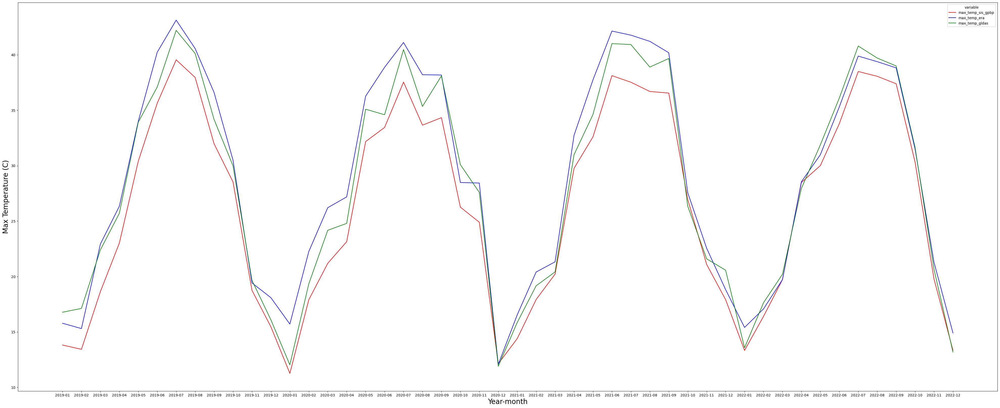

In [71]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

In [72]:
srb_1_max_gb_ym['sis_era_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis_gpbp'] - srb_1_max_gb_ym['max_temp_era'])
srb_1_max_gb_ym['sis_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis_gpbp'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['era_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_era'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['mean_diff'] = np.mean(srb_1_max_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

Text(0, 0.5, 'Mean Temp Diff (C)')

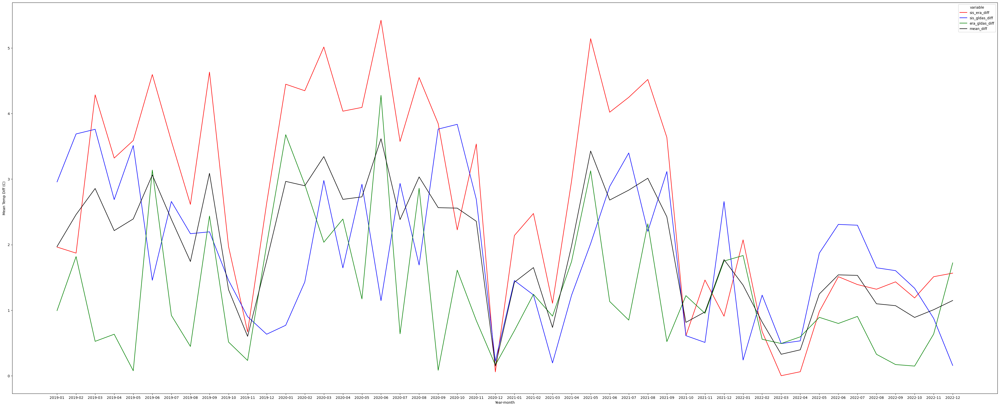

In [74]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym.drop(['max_temp_sis_gpbp', 'max_temp_era', 'max_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

# Georgia

## Level 1

### Avg Temp

In [2]:
srb_1_avg = pd.read_csv('/Users/sonle/Documents/work/WB/GED/validation/GEO_1_mean_temp.csv')
srb_1_avg['ym'] = srb_1_avg['date'].str[:7]
srb_1_avg['y'] = srb_1_avg['date'].str[:4]

srb_1_avg.head()

,GID_1,NAME_1,mean_temp_sis_gpbp,date,mean_temp_era,mean_temp_gldas,ym,y
0,GEO.1_1,Abkhazia,-3.614285,2019-01-01,-3.647740,-2.565171,2019-01,2019
1,GEO.2_1,Ajaria,-2.883364,2019-01-01,-3.157422,-2.420028,2019-01,2019
2,GEO.3_1,Guria,-0.158069,2019-01-01,-0.287458,1.083304,2019-01,2019
3,GEO.4_1,Imereti,-1.219321,2019-01-01,-1.428030,-0.372284,2019-01,2019
4,GEO.5_1,Kakheti,-1.910139,2019-01-01,-1.896554,-1.692720,2019-01,2019


In [4]:
srb_1_avg_gb_y_prov = srb_1_avg.groupby(['GID_1', 'y']).agg({
                                                             'mean_temp_sis_gpbp': 'mean',
                                                             'mean_temp_era': 'mean',
                                                             'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_y_prov.head()                                                             

,GID_1,y,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,GEO.10_1,2019,5.435379,5.393859,5.228009
1,GEO.10_1,2020,5.404548,5.370622,4.787739
2,GEO.10_1,2021,4.975704,4.843605,3.611043
3,GEO.10_1,2022,5.002555,4.857269,3.040448
4,GEO.11_1,2019,7.559766,7.601178,7.857321


In [5]:
srb_1_avg_gb_y_prov['sis_era_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis_gpbp'] - srb_1_avg_gb_y_prov['mean_temp_era'])
srb_1_avg_gb_y_prov['sis_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_sis_gpbp'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['era_gldas_diff'] = np.abs(srb_1_avg_gb_y_prov['mean_temp_era'] - srb_1_avg_gb_y_prov['mean_temp_gldas'])
srb_1_avg_gb_y_prov['mean_diff'] = np.mean(srb_1_avg_gb_y_prov[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)
srb_1_avg_gb_y_prov.describe()

,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,8.637595,8.571934,8.395740,0.146943,1.149799,1.058433,0.785058
std,2.435312,2.367777,2.644741,0.121464,1.151898,1.046036,0.755578
min,4.653009,4.678113,3.040448,0.004999,0.014440,0.051602,0.034401
25%,6.691339,6.601009,5.665612,0.037671,0.240515,0.202995,0.190436
50%,9.119116,9.053109,9.027781,0.137061,0.627421,0.612958,0.444618
75%,10.965821,10.793140,10.189229,0.230218,1.950659,1.776849,1.300440
max,12.174043,12.140006,13.115874,0.474032,3.880534,3.634602,2.587023


In [6]:
srb_1_avg_gb_ym = srb_1_avg.groupby(['ym']).agg({
                                                 'mean_temp_sis_gpbp': 'mean',
                                                'mean_temp_era': 'mean',
                                                'mean_temp_gldas': 'mean'}).reset_index()
srb_1_avg_gb_ym.head()




,ym,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas
0,2019-01,-1.873898,-1.927554,-0.702747
1,2019-02,-0.153500,-0.196219,0.590472
2,2019-03,1.394126,1.357816,1.729903
3,2019-04,6.108744,6.071698,6.500960
4,2019-05,13.285850,13.260790,13.377166


Text(0, 0.5, 'Average Temperature (C)')

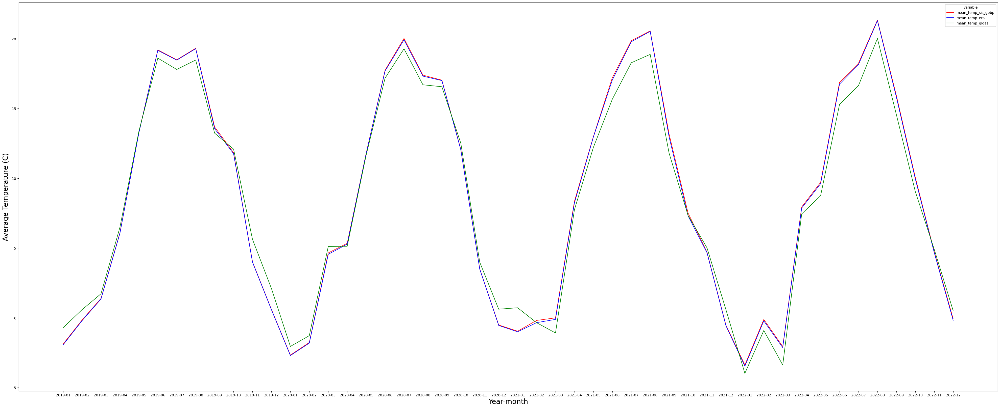

In [7]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Average Temperature (C)', fontsize=20)

,ym,mean_temp_sis_gpbp,mean_temp_era,mean_temp_gldas,sis_era_diff,sis_gldas_diff,era_gldas_diff,mean_diff
0,2019-01,-1.873898,-1.927554,-0.702747,0.053657,1.171150,1.224807,0.816538
1,2019-02,-0.153500,-0.196219,0.590472,0.042719,0.743972,0.786690,0.524460
2,2019-03,1.394126,1.357816,1.729903,0.036310,0.335777,0.372087,0.248058
3,2019-04,6.108744,6.071698,6.500960,0.037046,0.392216,0.429262,0.286175
4,2019-05,13.285850,13.260790,13.377166,0.025060,0.091315,0.116376,0.077584


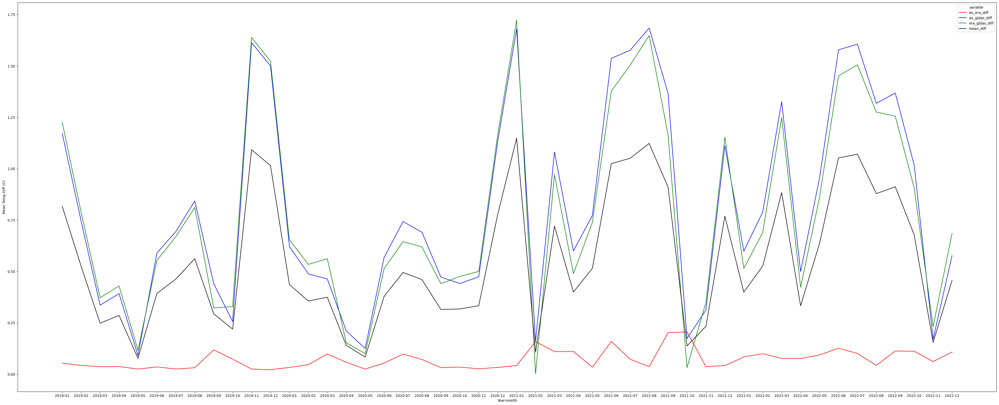

In [8]:
srb_1_avg_gb_ym['sis_era_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis_gpbp'] - srb_1_avg_gb_ym['mean_temp_era'])
srb_1_avg_gb_ym['sis_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_sis_gpbp'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['era_gldas_diff'] = np.abs(srb_1_avg_gb_ym['mean_temp_era'] - srb_1_avg_gb_ym['mean_temp_gldas'])
srb_1_avg_gb_ym['mean_diff'] = np.mean(srb_1_avg_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_avg_gb_ym.drop(['mean_temp_sis_gpbp', 'mean_temp_era', 'mean_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')
srb_1_avg_gb_ym.head()


### Max Temp

In [10]:
srb_1_max = pd.read_csv('GEO_1_max_temp.csv')
srb_1_max['ym'] = srb_1_max['date'].str[:7]
srb_1_max['y'] = srb_1_max['date'].str[:4]

srb_1_max.head()

,GID_1,NAME_1,max_temp_sis_gpbp,date,max_temp_era,max_temp_gldas,ym,y
0,GEO.1_1,Abkhazia,7.492981,2019-01-01,7.648538,7.896967,2019-01,2019
1,GEO.2_1,Ajaria,8.158691,2019-01-01,8.159113,6.716943,2019-01,2019
2,GEO.3_1,Guria,8.246277,2019-01-01,8.247003,7.796960,2019-01,2019
3,GEO.4_1,Imereti,6.499176,2019-01-01,7.317468,7.396967,2019-01,2019
4,GEO.5_1,Kakheti,10.286407,2019-01-01,10.317407,8.346948,2019-01,2019


In [11]:
srb_1_max_gb_ym = srb_1_max.groupby(['ym']).agg({
                                                 'max_temp_sis_gpbp': 'max',
                                                 'max_temp_era': 'max', 
                                                 'max_temp_gldas': 'max'}).reset_index()
srb_1_max_gb_ym.head()

,ym,max_temp_sis_gpbp,max_temp_era,max_temp_gldas
0,2019-01,18.348175,18.348718,17.997217
1,2019-02,19.618042,19.617578,20.022180
2,2019-03,23.108887,23.108606,22.403894
3,2019-04,27.160461,27.159738,28.670282
4,2019-05,33.560425,33.900430,35.116418


Text(0, 0.5, 'Max Temperature (C)')

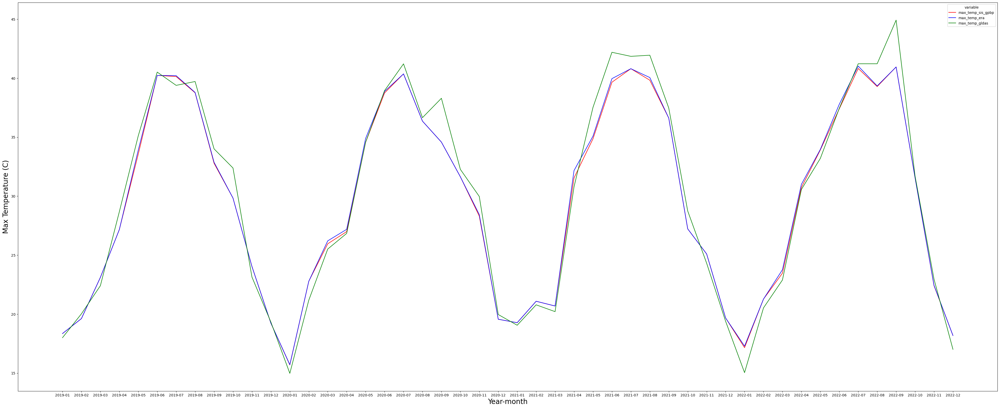

In [12]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym, ['ym']),
             palette=['red', 'blue', 'green'])
plt.xlabel('Year-month', fontsize=20)
plt.ylabel('Max Temperature (C)', fontsize=20)

In [13]:
srb_1_max_gb_ym['sis_era_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis_gpbp'] - srb_1_max_gb_ym['max_temp_era'])
srb_1_max_gb_ym['sis_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_sis_gpbp'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['era_gldas_diff'] = np.abs(srb_1_max_gb_ym['max_temp_era'] - srb_1_max_gb_ym['max_temp_gldas'])
srb_1_max_gb_ym['mean_diff'] = np.mean(srb_1_max_gb_ym[['sis_era_diff', 'sis_gldas_diff', 'era_gldas_diff']], axis=1)

Text(0, 0.5, 'Mean Temp Diff (C)')

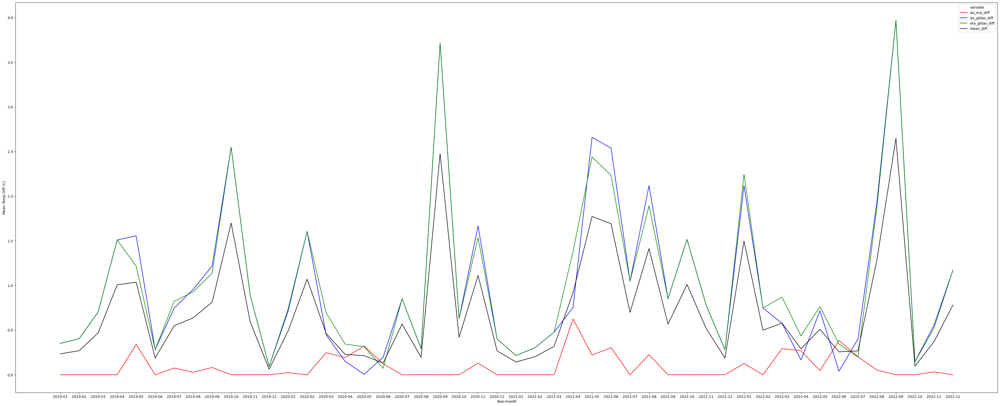

In [14]:
fig = plt.figure(figsize=[50, 20])
sns.lineplot(x='ym', y='value', hue='variable',
             data=pd.melt(srb_1_max_gb_ym.drop(['max_temp_sis_gpbp', 'max_temp_era', 'max_temp_gldas'], axis=1), ['ym']),
             palette=['red', 'blue', 'green', 'black'])
plt.xlabel('Year-month')
plt.ylabel('Mean Temp Diff (C)')

## Level 2

### Avg Temp

### Max Temp